# Graph theory

See https://github.com/multinetlab-amsterdam/network_TDA_tutorial/blob/main/1-network_analysis.ipynb for tutorial on network analysis

In [1]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import os
import glob as glob
import pickle 
import func
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import normalize
from nilearn.plotting import find_probabilistic_atlas_cut_coords


In [252]:

def get_features(res_path, folder):
    path = glob.glob(os.path.join(res_path, folder, 'features*'))
    features = dict()
    keys = ['pre', 'post', 'contrast']
    for p, key in zip(path,keys):
        features[key] = np.load(p, allow_pickle=True)
    return features
def load_dict(p,folder, name):
    with open(os.path.join(p,folder, name), 'rb') as f:
        results = pickle.load(f)
    return results
pipe_directory = r'C:\Users\Dylan\Desktop\UM_maitrise\projects\resting_state_hypnosis\pipeline'
def load_all(p, folder, atlas_name):
    atlas, atlas_labels, atlas_type, confounds = func.load_choose_atlas(atlas_name=atlas_name, main_cwd=pipe_directory)

    con_dict = load_dict(p, folder, 'dict_connectomes.pkl')
    graph_dict = load_dict(p, folder, 'dict_graphsMetrics.pkl')
    reg_dict = load_dict(p, folder, 'dict_regression.pkl')
    #features = get_features(p, folder)
    return con_dict, graph_dict, reg_dict, atlas, atlas_labels, confounds

p = r'C:\Users\Dylan\Desktop\UM_maitrise\projects\resting_state_hypnosis\results'
#C:\Users\Dylan\Desktop\UM_maitrise\projects\resting_state_hypnosis\results\difumo64_correlation_neg0_SVR

con_dict, graph_dict, reg_dict, atlas, atlas_labels, confounds = load_all(p, 'difumo64_correlation_neg0_SVR', 'difumo64')

roi_netw_path = r'C:\Users\Dylan\Desktop\UM_maitrise\projects\resting_state_hypnosis\pipeline\atlases\atlas_difumo64\labels_64_dictionary.csv'
networks_rois = pd.read_csv(roi_netw_path, index_col=0)
yeo17id = networks_rois['Yeo_networks17']

Loading atlas:  difumo64


In [258]:
reg_dict['change'].keys()

dict_keys(['Degree', 'Closeness', 'Betweenness'])

In [263]:
reg_dict['pre'].keys()

dict_keys(['Degree', 'Closeness', 'Betweenness', 'Clustering', 'Edge_weights'])

In [262]:
print(reg_dict['change']['Degree']['SHSS_score']['plot_title'],
reg_dict['change']['Closeness']['SHSS_score']['plot_title']) #.keys()

Betweenness based CV-prediction of SHSS_score Betweenness based CV-prediction of SHSS_score


In [25]:
#np.unique(atlas.get_fdata(), return_counts=True)

seed_con_post = results['seed_to_post_correlations']
seed_con_pre = results['seed_to_pre_correlations']
seed_contrast_connectomes = [seed_con_post[i] - seed_con_pre[i] for i in range(len(seed_con_post))]
mean_seed_contrast = results['mean_seed_contrast_connectome']
print(len(seed_con_post), results['seed_to_post_correlations'][0].shape)

31 (64, 5)


In [8]:
pre_mean_connectome = results['pre_mean_connectome']
post_mean_connectome = results['post_mean_connectome']
pre_connectomes = results['pre_connectomes']
post_connectomes = results['post_connectomes']
print(pre_mean_connectome.min(), post_mean_connectome.min())
contrast_mean_connectome = results['zcontrast_mean_connectome']
print(contrast_mean_connectome.max(), contrast_mean_connectome.min())
zcontrast = contrast_mean_connectome 

-0.09702450511866395 -0.08859615378496309
0.05025576301256056 -0.05975336299290883


In [ ]:
# zeros for negatives edges
abs_pre_connectome = [np.maximum(connectome, 0) for connectome in results['pre_connectomes']]
abs_post_connectome = [np.maximum(connectome, 0) for connectome in results['post_connectomes']]
abs_mean_post = abs_post_connectomes.mean(axis=0)



In [35]:
import matplotlib.cm as cm
from scipy import stats
from scipy.stats import ttest_1samp

original_matrix = mean_seed_contrast
# Create a 64x64 matrix filled with zeros
square_matrix = np.zeros((64, 64))

# Insert the original matrix into the top-left corner of the square matrix
square_matrix[:original_matrix.shape[0], :original_matrix.shape[1]] = original_matrix

A = square_matrix
G = nx.from_numpy_matrix(np.matrix(A), create_using=nx.Graph)
G = nx.relabel_nodes(G, dict(zip(range(len(G.nodes())),labels)))
G.edges.data('weight')
edge_weights = G.edges.data('weight')



c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\nilearn\plotting\displays\_projectors.py:166: UserWarning: 'adjacency_matrix' is not symmetric. A directed graph will be plotted.
  warnings.warn(("'adjacency_matrix' is not symmetric. "


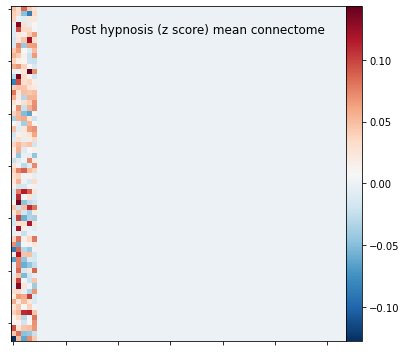

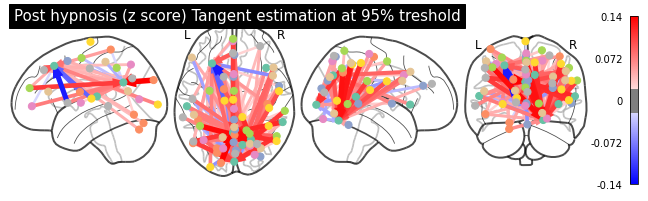

In [36]:
from nilearn import plotting
mat = A
plotting.plot_matrix(
    mat, colorbar=True, title = 'Post hypnosis (z score) mean connectome ')#, tri ='lower')

con_tresh = '95%'
cond = 'Post hypnosis (z score)'
cov_estim = 'Tangent estimation'

plotting.plot_connectome(
                mat,
                find_probabilistic_atlas_cut_coords(atlas),
                edge_threshold=con_tresh,
                title=f"{cond} {cov_estim} at {con_tresh} treshold",
                display_mode="lzry",
                colorbar=True,
            )
plotting.show()


Find extreme values for tresholds

In [20]:
changeW = con_dict['diff_weight_connectomes']
meanchange = np.mean(np.stack(changeW, axis=-1), axis=-1)

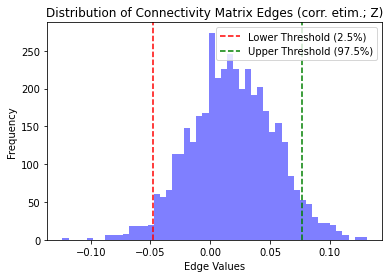

Lower Threshold (2.5%): -0.04830159752544945
Upper Threshold (97.5%): 0.07644261391986917


In [22]:
# Histogram highest 5% values
import matplotlib.pyplot as plt
import numpy as np

# Flatten the connectivity matrix to a 1D array
edges_values = meanchange.flatten()

# Plot the histogram of edges' values
plt.hist(edges_values, bins=50, color='blue', alpha=0.5)
plt.xlabel('Edge Values')
plt.ylabel('Frequency')
plt.title('Distribution of Connectivity Matrix Edges (corr. etim.; Z)')

# Find the threshold values at the 2.5% extremes
lower_threshold = np.percentile(edges_values, 2.5)
upper_threshold = np.percentile(edges_values, 95)

# Display the threshold values on the plot
plt.axvline(x=lower_threshold, color='red', linestyle='--', label='Lower Threshold (2.5%)')
plt.axvline(x=upper_threshold, color='green', linestyle='--', label='Upper Threshold (97.5%)')
plt.legend()

# Show the plot
plt.show()

# Print the threshold values
print("Lower Threshold (2.5%):", lower_threshold)
print("Upper Threshold (97.5%):", upper_threshold)

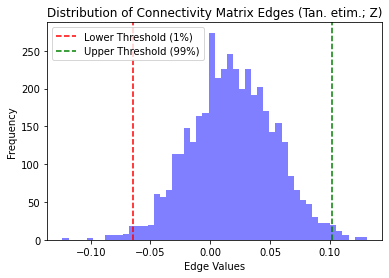

Lower Threshold (1%): -0.06493333181082567
Upper Threshold (99%): 0.10215430836243065


In [23]:
#Hist highest 1% values
import matplotlib.pyplot as plt
import numpy as np

# Flatten the connectivity matrix to a 1D array
edges_values = meanchange.flatten()

# Plot the histogram of edges' values
plt.hist(edges_values, bins=50, color='blue', alpha=0.5)
plt.xlabel('Edge Values')
plt.ylabel('Frequency')
plt.title('Distribution of Connectivity Matrix Edges (Tan. etim.; Z)')

# Find the lower and upper threshold values at the desired percentiles
lower_threshold = np.percentile(edges_values, 1)
upper_threshold = np.percentile(edges_values, 99)

# Display the threshold values on the plot
plt.axvline(x=lower_threshold, color='red', linestyle='--', label='Lower Threshold (1%)')
plt.axvline(x=upper_threshold, color='green', linestyle='--', label='Upper Threshold (99%)')
plt.legend()

# Show the plot
plt.show()

# Print the threshold values
print("Lower Threshold (1%):", lower_threshold)
print("Upper Threshold (99%):", upper_threshold)


## 2. post-pre contrast correlation (figures)

In [31]:
X = meanchange
zcontrast = meanchange
labels = atlas_labels
# Define the absolute threshold values
positive_threshold =   upper_threshold
negative_threshold = lower_threshold

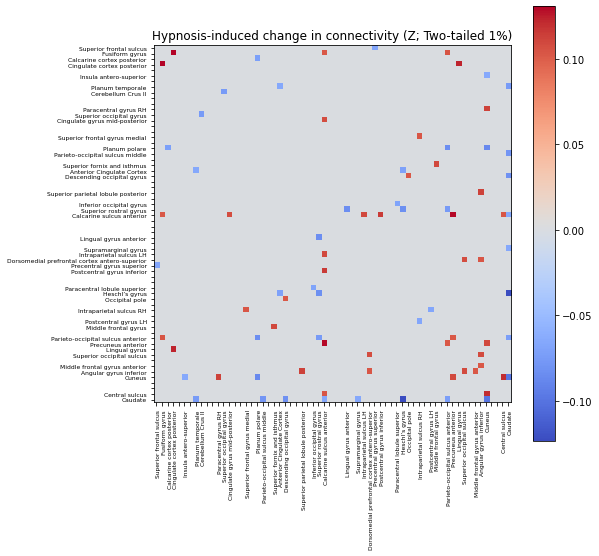

In [28]:
zcontrast_thresholded = np.where(X >= positive_threshold, X, 0)
zcontrast_thresholded = np.where(X <= negative_threshold, X, zcontrast_thresholded)

# Get the indices of the significant labels based on the thresholds
significant_labels_indices = np.where(np.sum(np.abs(zcontrast_thresholded), axis=0) > 0)[0]
significant_labels = [atlas_labels[i] if i in significant_labels_indices else ' ' for i in range(len(atlas_labels))]

fig, ax = plt.subplots(figsize=(8, 8))  # Adjust the figure size as needed
im = ax.imshow(zcontrast_thresholded, cmap='coolwarm')

# Set the tick labels and font size
ax.set_xticks(np.arange(len(atlas_labels)))
ax.set_yticks(np.arange(len(atlas_labels)))
ax.set_xticklabels(significant_labels, fontsize=6)  # Adjust the label font size as desired
ax.set_yticklabels(significant_labels, fontsize=6)  # Adjust the label font size as desired
plt.setp(ax.get_xticklabels(), rotation=90, ha="right", rotation_mode="anchor")
ax.set_title('Hypnosis-induced change in connectivity (Z; Two-tailed 1%)')
cbar = ax.figure.colorbar(im, ax=ax)
plt.show()

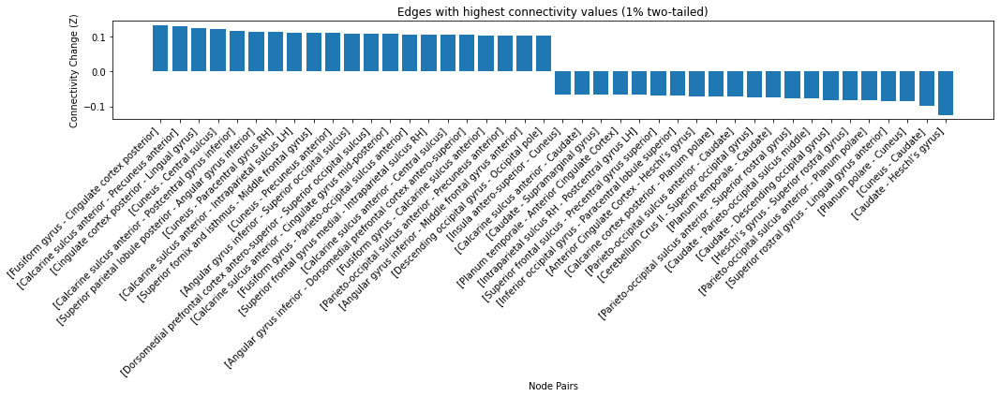

In [32]:
zcontrast_thresholded = np.where(zcontrast >= positive_threshold, zcontrast, 0)
zcontrast_thresholded = np.where(zcontrast <= negative_threshold, zcontrast, zcontrast_thresholded)
significant_labels_indices = np.where(np.sum(np.abs(zcontrast_thresholded), axis=0) > 0)[0]

G = nx.Graph()
for i in significant_labels_indices:
    for j in range(i + 1, len(labels)):
        edge_weight = zcontrast_thresholded[i, j]
        if edge_weight != 0:
            G.add_edge(labels[i], labels[j], weight=edge_weight)

# Sort the edges based on their weights in descending order
sorted_edges = sorted(G.edges(data=True), key=lambda x: x[2]['weight'], reverse=True)

# Create a pandas DataFrame to store the pairs of nodes and connectivity change (z value)
data = {
    'Node Pair': [f"[{u} - {v}]" for u, v, _ in sorted_edges],
    'Connectivity Change (Z)': [data['weight'] for _, _, data in sorted_edges]
}

df = pd.DataFrame(data)
df.to_csv('connectivity_changes.csv', index=False)

plt.figure(figsize=(15, 6))
plt.bar(df['Node Pair'], df['Connectivity Change (Z)'])
plt.xticks(rotation=45, ha='right')
plt.xlabel('Node Pairs')
plt.ylabel('Connectivity Change (Z)')
plt.title('Edges with highest connectivity values (1% two-tailed)')
plt.tight_layout()

# Save the plot as an image
plt.savefig('connectivity_changes.png')

# Show the plot (optional)
plt.show()


In [61]:
#Number of connections on matrix
# Create an empty graph
G = nx.Graph()

# Get the number of nodes in the matrix
num_nodes = zcontrast_thresholded.shape[0]

# Add nodes to the graph with labels
node_labels = [f"Node {i} ({labels[i]})" for i in range(num_nodes)]
G.add_nodes_from(range(num_nodes), label=node_labels)

# Iterate over the lower triangle of the thresholded matrix and add edges with non-zero values to the graph
for i in range(num_nodes):
    for j in range(i):  # Only iterate over the lower triangle
        edge_value = zcontrast_thresholded[i, j]
        if edge_value != 0 and labels[i] != ' ' and labels[j] != ' ':
            G.add_edge(i, j, weight=edge_value)

# Create a dictionary to store the number of non-empty connections for each node
non_empty_connections_dict = {node: 0 for node in G.nodes()}

# Count the number of non-empty connections for each node
for node in G.nodes():
    non_empty_connections = [1 for nbr in G[node] if G.nodes[nbr]['label'] != ' ']
    non_empty_connections_dict[node] = sum(non_empty_connections)

# Sort nodes based on the number of non-empty connections in descending order
sorted_nodes = sorted(non_empty_connections_dict.keys(), key=lambda x: non_empty_connections_dict[x], reverse=True)

# Print the nodes with their labels and the number of non-zero connections with non-empty labels
for node in sorted_nodes:
    if non_empty_connections_dict[node] >= 1:
        idx = int(node)
        print(f"{labels[idx]}: {non_empty_connections_dict[node]} non-zero connections")


Calcarine sulcus anterior: 7 non-zero connections
Paracentral lobule superior: 7 non-zero connections
Parieto-occipital sulcus anterior: 5 non-zero connections
Cuneus: 5 non-zero connections
Occipital pole: 4 non-zero connections
Angular gyrus inferior: 4 non-zero connections
Central sulcus: 4 non-zero connections
Caudate: 4 non-zero connections
Cerebellum I-V: 3 non-zero connections
Heschl’s gyrus: 3 non-zero connections
Middle frontal gyrus: 3 non-zero connections
Paracentral gyrus RH: 2 non-zero connections
Superior frontal gyrus medial: 2 non-zero connections
Planum polare: 2 non-zero connections
Anterior Cingulate Cortex: 2 non-zero connections
Descending occipital gyrus: 2 non-zero connections
Lingual gyrus anterior: 2 non-zero connections
Superior parietal lobule: 2 non-zero connections
Superior frontal gyrus: 2 non-zero connections
Superior frontal sulcus: 1 non-zero connections
Fusiform gyrus: 1 non-zero connections
Calcarine cortex posterior: 1 non-zero connections
Cingulate 

In [265]:
from nilearn import plotting 
import matplotlib.pyplot as plt

# change depending on atlas type
coords = plotting.find_probabilistic_atlas_cut_coords(atlas)
#coords = plotting.find_parcellation_cut_coords(atlas)
view = plotting.view_connectome(zcontrast_thresholded, coords, node_size = 7,  title = 'Change in connectivity (Z; 1% tresh.)')

output_file = "images/1imgs_difumo/contrast_correlation_viewcon.png"  # Specify the desired output file path and extension
#view.save_as_html(output_file)
view


# Extracting changes (post-pre) in graphs metrics

In [40]:
change_gmetrics = graph_dict['change_feat']
gmetrics = list(graph_dict['change_feat'].keys())
gmetrics

['degree', 'closenessCent', 'betweennessCent', 'clustering']

In [63]:
import matplotlib.cm as cm
from scipy import stats
from scipy.stats import ttest_1samp

graph_dict
A = zcontrast
G = nx.from_numpy_matrix(np.matrix(A), create_using=nx.Graph)
G = nx.relabel_nodes(G, dict(zip(range(len(G.nodes())),labels)))
G.edges.data('weight')
edge_weights = G.edges.data('weight')



In [64]:
#'Gbin' Binarized graph based on previous 1% threshold
# Apply the thresholds to the connectome matrix
zcontrast_binarized = np.where(np.abs(zcontrast_thresholded) > 0, 1, 0)

Gbin = nx.from_numpy_matrix(zcontrast_binarized)

# Assign node labels
labels_dict = {i: label for i, label in enumerate(significant_labels)}
nx.set_node_attributes(Gbin, labels_dict, 'label')

# Convert the edge weights to integers (0 or 1)
edge_weights_dict = {(u, v): int(weight) for u, v, weight in Gbin.edges(data='weight')}
nx.set_edge_attributes(Gbin, edge_weights_dict, 'weight')


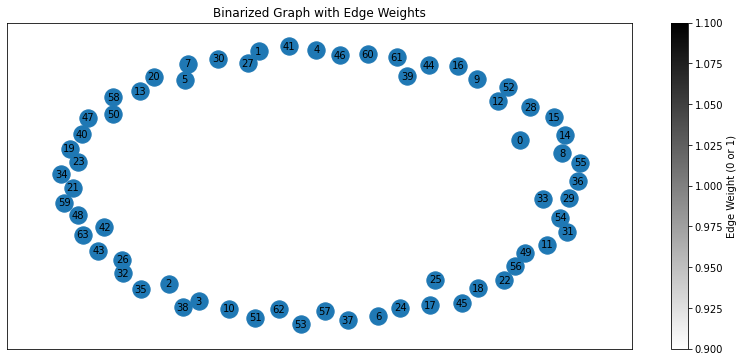

In [65]:
plt.figure(figsize=(14, 6))
pos = nx.spring_layout(Gbin, k=8)

# Extract edge weights
edge_weights = [data['weight'] for _, _, data in Gbin.edges(data=True)]

# Define colormap (you can adjust the colormap as needed)
cmap = plt.cm.binary

# Draw the graph with colored edges
nx.draw_networkx_nodes(Gbin, pos)
nx.draw_networkx_labels(Gbin, pos, font_size=10)
edge_colors = nx.draw_networkx_edges(Gbin, pos, edge_color=edge_weights, edge_cmap=cmap)

# Add color bar
cbar = plt.colorbar(edge_colors)
cbar.set_label('Edge Weight (0 or 1)')

save_path = os.path.join('images', 'binarized_graph.png')
plt.title('Binarized Graph with Edge Weights')
#plt.savefig(save_path)
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: 'images\\contrast_correlation_graph.png'

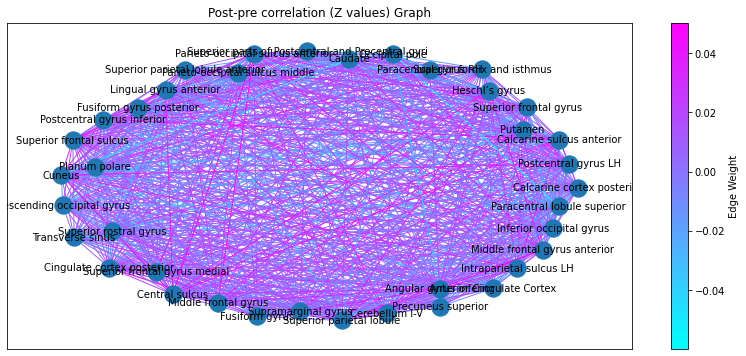

In [67]:
import matplotlib.cm as cm

# Collect node names for edges that meet the thresholds
nodes_to_keep = set()
for u, v, data in G.edges(data=True):
    if data['weight'] <= negative_threshold or data['weight'] >= positive_threshold:
        nodes_to_keep.add(u)
        nodes_to_keep.add(v)

# Create a subgraph with the filtered nodes
H = G.subgraph(nodes_to_keep)


plt.figure(figsize=(14, 6))
pos = nx.spring_layout(H, k=8)

# Extract edge weights
edge_weights = [data['weight'] for _, _, data in H.edges(data=True)]
min_edge_weight = min(edge_weights)
max_edge_weight = max(edge_weights)

# Define colormap
cmap = cm.get_cmap('cool')  # Choose a colormap

# Draw the subgraph with colored edges
nx.draw_networkx_nodes(H, pos)
nx.draw_networkx_labels(H, pos, font_size=10)
edge_colors = nx.draw_networkx_edges(H, pos, edge_color=edge_weights, edge_cmap=cmap)

# Add color bar
sm = cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min_edge_weight, vmax=max_edge_weight))
sm.set_array([])
cbar = plt.colorbar(sm)
cbar.set_label('Edge Weight')

save_path = os.path.join('images', 'contrast_correlation_graph.png')
plt.title('Post-pre correlation (Z values) Graph')
plt.savefig(save_path)
plt.show()

Graph metrics

In [43]:
yeo17id = networks_rois['Yeo_networks17']
yeo7id = networks_rois['Yeo_networks7']
degrees = change_gmetrics['degree']
mean_degrees = degrees.mean()
mean_degrees.shape

(64,)

### Plot mean graphs' metrics for change (post-pre) in connectivity

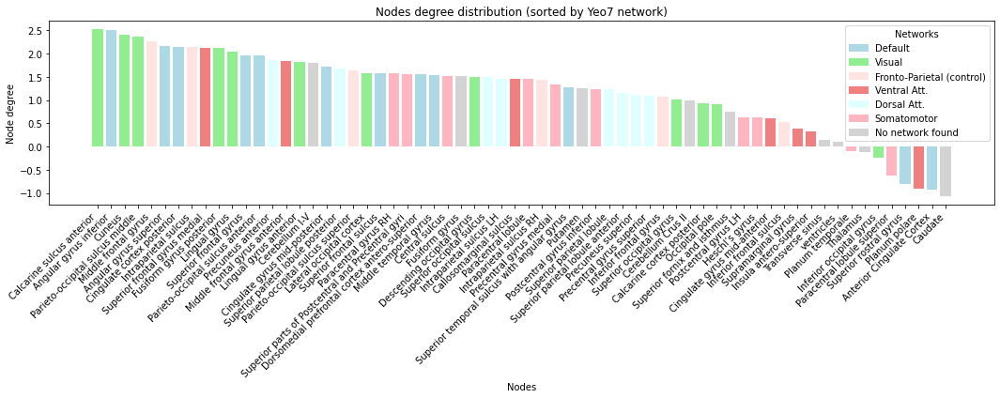

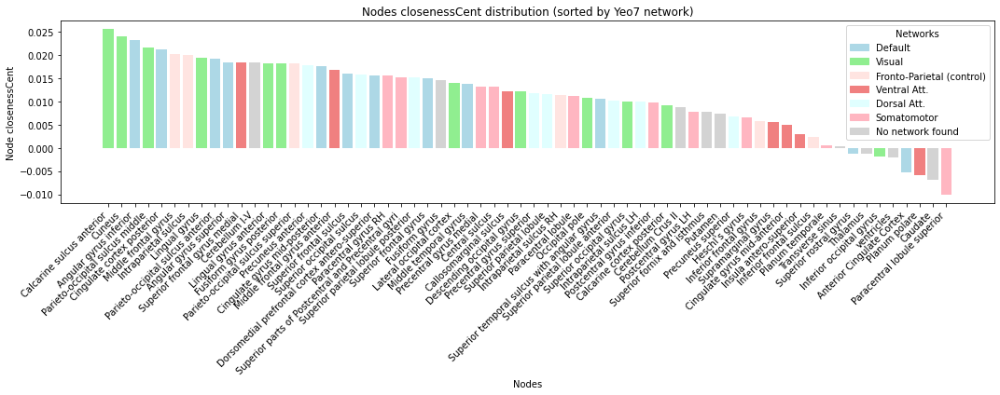

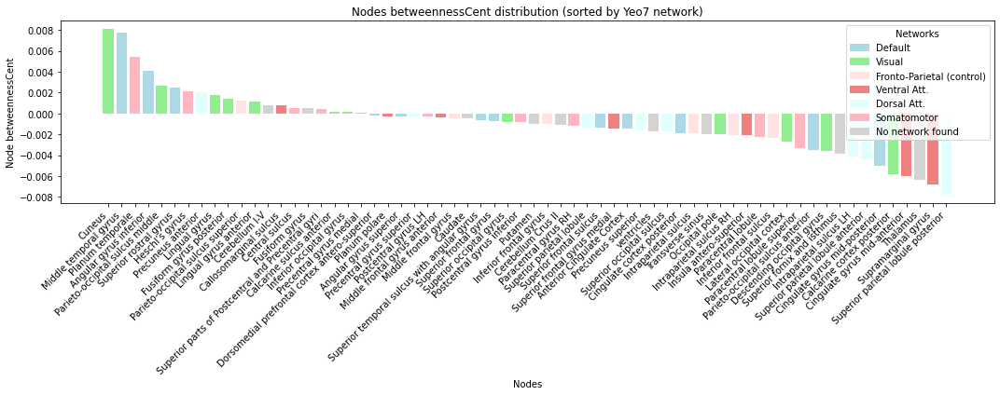

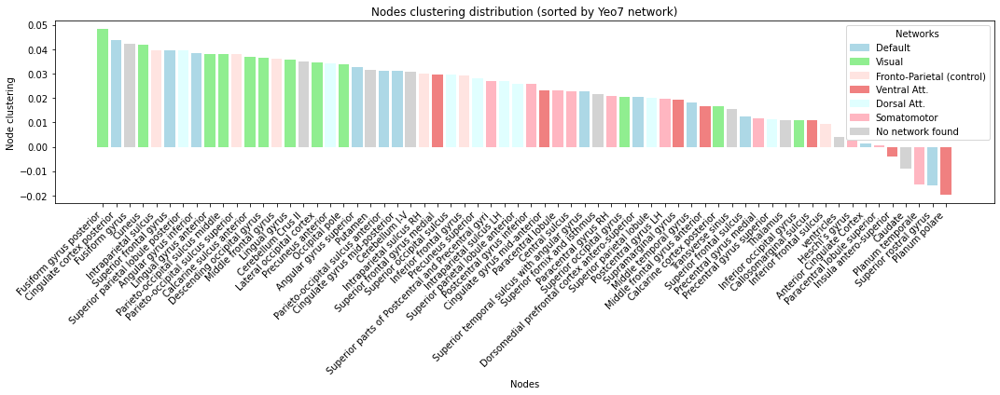

In [167]:
import matplotlib.pyplot as plt

# Define the network colors with a different palette
network_colors = {
    'DefaultB': 'lightblue',
    'VisCent': 'lightgreen',
    'ContA': 'mistyrose',
    'SalVentAttnA': 'lightcoral',
    'DorsAttnB': 'lightcyan',
    'SomMotA': 'lightpink',
    'No network found': 'lightgray'
}

for metric_name in list(graph_dict['change_feat'].keys()):
    # Get Data (mean array, labels and the network ids)
    data_array = graph_dict['change_feat'][metric_name] # metrics name will be degree, betweenness, etc.
    mean_metrics = data_array.mean()
   
    # Sort the nodes based on values (highest to lowest)
    sorted_triplet = sorted(zip(mean_metrics, labels, yeo7id), reverse=True)
    sorted_mean_metrics, sorted_nodes, sorted_yeo7id = zip(*sorted_triplet)

    sorted_colors = [network_colors[network] for network in sorted_yeo7id] # list all colors for each node

    # Rename the networks 
    full_nw_names = {
    'DefaultB': 'Default',
    'VisCent': 'Visual',
    'ContA': 'Fronto-Parietal (control)',
    'SalVentAttnA': 'Ventral Att.',
    'DorsAttnB': 'Dorsal Att.',
    'SomMotA': 'Somatomotor',
    'No network found': 'No network found'
    }
    renamed_networks = [full_nw_names[tag] for tag in network_colors] # rename the keys/network

    # Plot the sorted degree values with colors
    plt.figure(figsize=(15, 6))
    plt.bar(sorted_nodes, sorted_mean_metrics, color=sorted_colors)
    plt.xticks(rotation=45, ha='right')
    plt.xlabel('Nodes')
    plt.ylabel(f'Node {metric_name}')
    plt.title(f'Nodes {metric_name} distribution (sorted by Yeo7 network)')
    
    # Add a legend
    legend_handles = [plt.Rectangle((0,0),1,1, color=network_colors[network]) for network in network_colors]
    plt.legend(legend_handles, renamed_networks, title='Networks', loc='upper right')

    plt.tight_layout()
    plt.show()


## 2.1 Intersubject predictions (correlation)

#### Loading graphs metrics for prediction

In [115]:
print(graph_dict.keys())
change_gmetrics = graph_dict['change_feat']
print(change_gmetrics.keys())
gmetrics = list(graph_dict['change_feat'].keys())
yeo7id = networks_rois['Yeo_networks7'] # for splitting df into networks
Y = graph_dict['Y']
print('Y columns : ', Y.columns)
#reg_dict.keys()

dict_keys(['pre', 'post', 'change', 'pre_metrics', 'post_metrics', 'change_feat', 'Y'])
dict_keys(['degree', 'closenessCent', 'betweennessCent', 'clustering'])
Y columns :  Index(['SHSS_score', 'raw_change_ANA', 'raw_change_HYPER',
       'total_chge_pain_hypAna', 'Chge_hypnotic_depth',
       'Mental_relax_absChange', 'Automaticity_post_ind',
       'Abs_diff_automaticity', 'SHSS_groups', 'auto_groups'],
      dtype='object')


====== DefaultB ======
====== SHSS_score ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.374
Model:                            OLS   Adj. R-squared:                 -0.043
Method:                 Least Squares   F-statistic:                    0.8979
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.565
Time:                        02:05:09   Log-Likelihood:                -75.456
No. Observations:                  31   AIC:                             176.9
Df Residuals:                      18   BIC:                             195.6
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

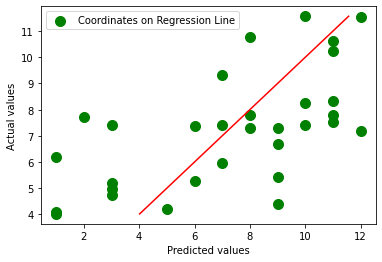

====== raw_change_ANA ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.194
Model:                            OLS   Adj. R-squared:                 -0.343
Method:                 Least Squares   F-statistic:                    0.3609
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.962
Time:                        02:05:10   Log-Likelihood:                -107.34
No. Observations:                  31   AIC:                             240.7
Df Residuals:                      18   BIC:                             259.3
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -6.3606  

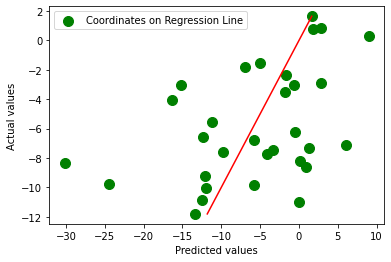

====== raw_change_HYPER ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.148
Model:                            OLS   Adj. R-squared:                 -0.421
Method:                 Least Squares   F-statistic:                    0.2598
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.989
Time:                        02:05:10   Log-Likelihood:                -123.61
No. Observations:                  31   AIC:                             273.2
Df Residuals:                      18   BIC:                             291.9
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         13.1366

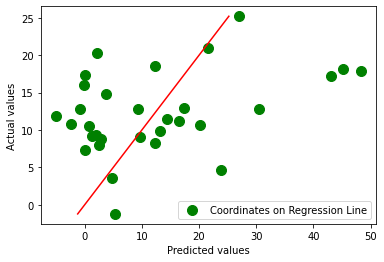

====== total_chge_pain_hypAna ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.132
Model:                            OLS   Adj. R-squared:                 -0.447
Method:                 Least Squares   F-statistic:                    0.2280
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.994
Time:                        02:05:11   Log-Likelihood:                -134.13
No. Observations:                  31   AIC:                             294.3
Df Residuals:                      18   BIC:                             312.9
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         1

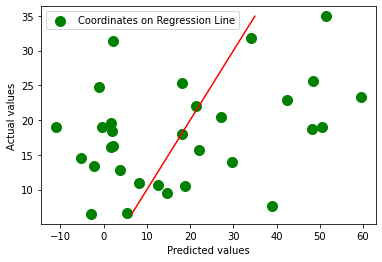

====== Chge_hypnotic_depth ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.252
Model:                            OLS   Adj. R-squared:                 -0.246
Method:                 Least Squares   F-statistic:                    0.5064
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.884
Time:                        02:05:11   Log-Likelihood:                -139.98
No. Observations:                  31   AIC:                             306.0
Df Residuals:                      18   BIC:                             324.6
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         41.3

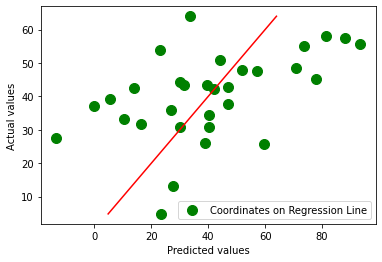

====== Mental_relax_absChange ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.349
Model:                            OLS   Adj. R-squared:                 -0.085
Method:                 Least Squares   F-statistic:                    0.8052
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.643
Time:                        02:05:12   Log-Likelihood:                -129.32
No. Observations:                  31   AIC:                             284.6
Df Residuals:                      18   BIC:                             303.3
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -

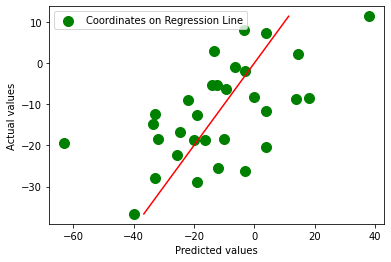

====== Automaticity_post_ind ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.501
Model:                            OLS   Adj. R-squared:                  0.168
Method:                 Least Squares   F-statistic:                     1.505
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.210
Time:                        02:05:12   Log-Likelihood:                -135.79
No. Observations:                  31   AIC:                             297.6
Df Residuals:                      18   BIC:                             316.2
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         55

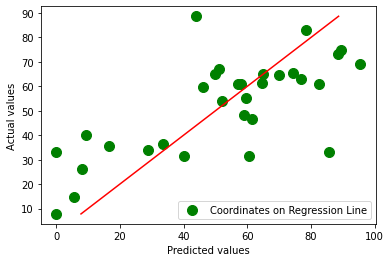

====== Abs_diff_automaticity ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.613
Model:                            OLS   Adj. R-squared:                  0.356
Method:                 Least Squares   F-statistic:                     2.380
Date:                Thu, 19 Oct 2023   Prob (F-statistic):             0.0469
Time:                        02:05:13   Log-Likelihood:                -129.02
No. Observations:                  31   AIC:                             284.0
Df Residuals:                      18   BIC:                             302.7
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         27

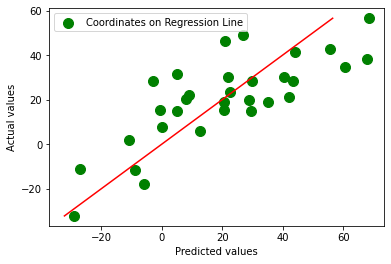

====== SHSS_groups ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.272
Model:                            OLS   Adj. R-squared:                 -0.213
Method:                 Least Squares   F-statistic:                    0.5611
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.845
Time:                        02:05:13   Log-Likelihood:                -32.906
No. Observations:                  31   AIC:                             91.81
Df Residuals:                      18   BIC:                             110.5
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.0865     

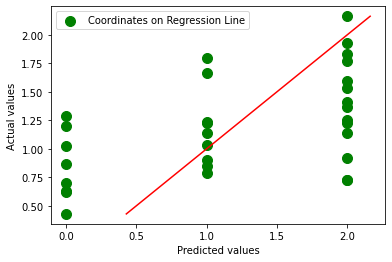

====== auto_groups ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.554
Model:                            OLS   Adj. R-squared:                  0.257
Method:                 Least Squares   F-statistic:                     1.867
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.112
Time:                        02:05:14   Log-Likelihood:                -21.204
No. Observations:                  31   AIC:                             68.41
Df Residuals:                      18   BIC:                             87.05
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.1616     

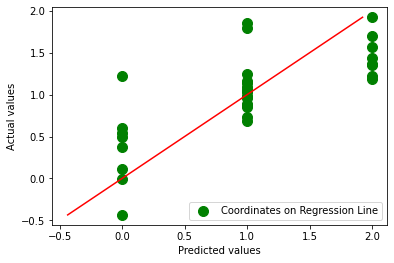

====== VisCent ======
====== SHSS_score ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.315
Model:                            OLS   Adj. R-squared:                 -0.142
Method:                 Least Squares   F-statistic:                    0.6889
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.742
Time:                        02:05:14   Log-Likelihood:                -76.869
No. Observations:                  31   AIC:                             179.7
Df Residuals:                      18   BIC:                             198.4
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const

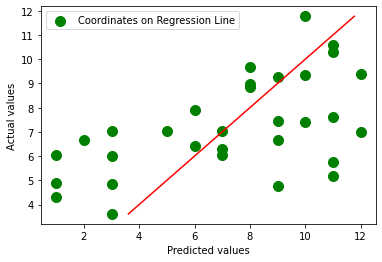

====== raw_change_ANA ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.236
Model:                            OLS   Adj. R-squared:                 -0.273
Method:                 Least Squares   F-statistic:                    0.4640
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.911
Time:                        02:05:14   Log-Likelihood:                -106.51
No. Observations:                  31   AIC:                             239.0
Df Residuals:                      18   BIC:                             257.7
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -4.4006  

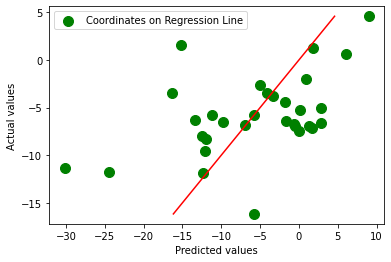

====== raw_change_HYPER ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.277
Model:                            OLS   Adj. R-squared:                 -0.205
Method:                 Least Squares   F-statistic:                    0.5747
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.835
Time:                        02:05:15   Log-Likelihood:                -121.06
No. Observations:                  31   AIC:                             268.1
Df Residuals:                      18   BIC:                             286.8
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.7654

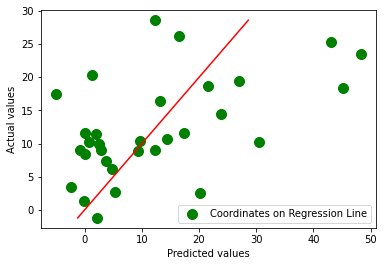

====== total_chge_pain_hypAna ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.212
Model:                            OLS   Adj. R-squared:                 -0.314
Method:                 Least Squares   F-statistic:                    0.4024
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.944
Time:                        02:05:15   Log-Likelihood:                -132.64
No. Observations:                  31   AIC:                             291.3
Df Residuals:                      18   BIC:                             309.9
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         1

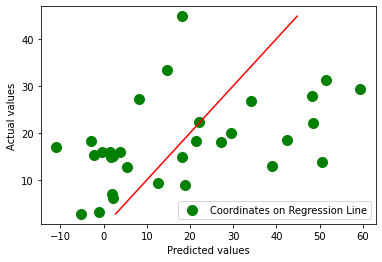

====== Chge_hypnotic_depth ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.367
Model:                            OLS   Adj. R-squared:                 -0.054
Method:                 Least Squares   F-statistic:                    0.8708
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.588
Time:                        02:05:16   Log-Likelihood:                -137.40
No. Observations:                  31   AIC:                             300.8
Df Residuals:                      18   BIC:                             319.4
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         38.6

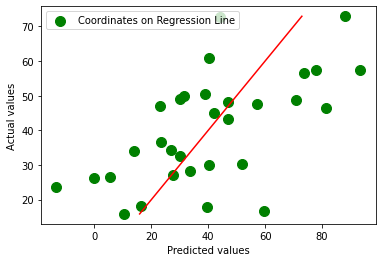

====== Mental_relax_absChange ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.399
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                    0.9962
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.489
Time:                        02:05:17   Log-Likelihood:                -128.09
No. Observations:                  31   AIC:                             282.2
Df Residuals:                      18   BIC:                             300.8
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -1

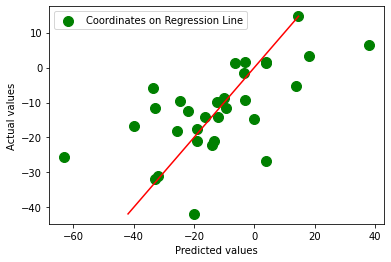

====== Automaticity_post_ind ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.469
Model:                            OLS   Adj. R-squared:                  0.116
Method:                 Least Squares   F-statistic:                     1.327
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.285
Time:                        02:05:17   Log-Likelihood:                -136.73
No. Observations:                  31   AIC:                             299.5
Df Residuals:                      18   BIC:                             318.1
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         53

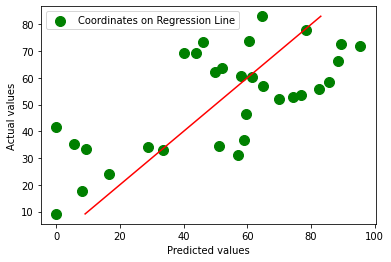

====== Abs_diff_automaticity ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.309
Model:                            OLS   Adj. R-squared:                 -0.151
Method:                 Least Squares   F-statistic:                    0.6711
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.757
Time:                        02:05:18   Log-Likelihood:                -138.02
No. Observations:                  31   AIC:                             302.0
Df Residuals:                      18   BIC:                             320.7
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         21

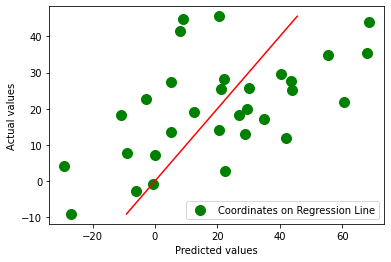

====== SHSS_groups ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.317
Model:                            OLS   Adj. R-squared:                 -0.139
Method:                 Least Squares   F-statistic:                    0.6954
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.736
Time:                        02:05:18   Log-Likelihood:                -31.927
No. Observations:                  31   AIC:                             89.85
Df Residuals:                      18   BIC:                             108.5
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.9949     

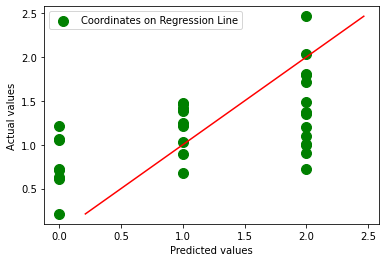

====== auto_groups ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.370
Model:                            OLS   Adj. R-squared:                 -0.050
Method:                 Least Squares   F-statistic:                    0.8816
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.579
Time:                        02:05:19   Log-Likelihood:                -26.570
No. Observations:                  31   AIC:                             79.14
Df Residuals:                      18   BIC:                             97.78
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.9959     

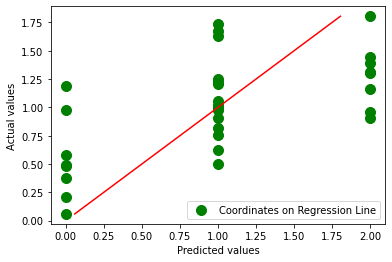

====== ContA ======
====== SHSS_score ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.272
Model:                            OLS   Adj. R-squared:                  0.090
Method:                 Least Squares   F-statistic:                     1.497
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.222
Time:                        02:05:20   Log-Likelihood:                -77.800
No. Observations:                  31   AIC:                             169.6
Df Residuals:                      24   BIC:                             179.6
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const  

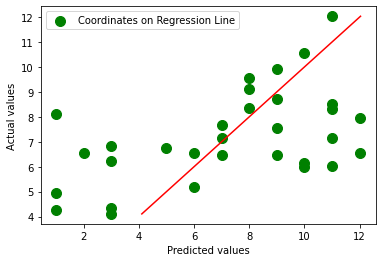

====== raw_change_ANA ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.061
Model:                            OLS   Adj. R-squared:                 -0.174
Method:                 Least Squares   F-statistic:                    0.2599
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.950
Time:                        02:05:20   Log-Likelihood:                -109.71
No. Observations:                  31   AIC:                             233.4
Df Residuals:                      24   BIC:                             243.5
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -5.9250  

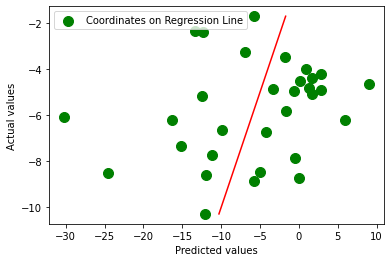

====== raw_change_HYPER ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.259
Model:                            OLS   Adj. R-squared:                  0.074
Method:                 Least Squares   F-statistic:                     1.400
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.255
Time:                        02:05:20   Log-Likelihood:                -121.44
No. Observations:                  31   AIC:                             256.9
Df Residuals:                      24   BIC:                             266.9
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.5938

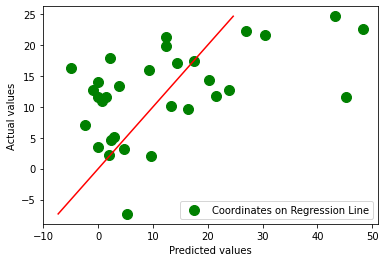

====== total_chge_pain_hypAna ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.197
Model:                            OLS   Adj. R-squared:                 -0.004
Method:                 Least Squares   F-statistic:                    0.9798
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.460
Time:                        02:05:21   Log-Likelihood:                -132.93
No. Observations:                  31   AIC:                             279.9
Df Residuals:                      24   BIC:                             289.9
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         1

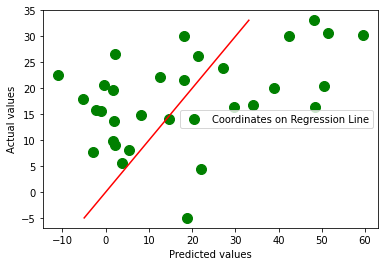

====== Chge_hypnotic_depth ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.191
Model:                            OLS   Adj. R-squared:                 -0.011
Method:                 Least Squares   F-statistic:                    0.9454
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.482
Time:                        02:05:21   Log-Likelihood:                -141.20
No. Observations:                  31   AIC:                             296.4
Df Residuals:                      24   BIC:                             306.4
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         39.6

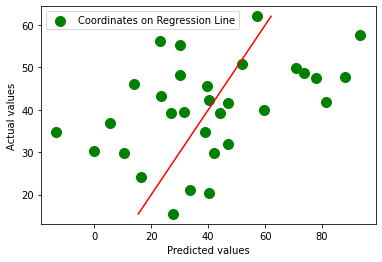

====== Mental_relax_absChange ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.174
Model:                            OLS   Adj. R-squared:                 -0.033
Method:                 Least Squares   F-statistic:                    0.8403
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.551
Time:                        02:05:22   Log-Likelihood:                -133.03
No. Observations:                  31   AIC:                             280.1
Df Residuals:                      24   BIC:                             290.1
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -

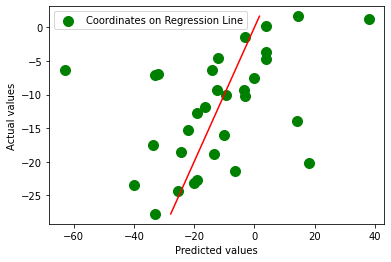

====== Automaticity_post_ind ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.200
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.9980
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.449
Time:                        02:05:22   Log-Likelihood:                -143.10
No. Observations:                  31   AIC:                             300.2
Df Residuals:                      24   BIC:                             310.2
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         51

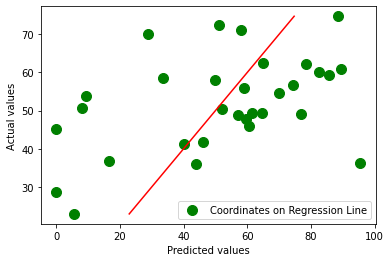

====== Abs_diff_automaticity ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.228
Model:                            OLS   Adj. R-squared:                  0.034
Method:                 Least Squares   F-statistic:                     1.178
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.351
Time:                        02:05:23   Log-Likelihood:                -139.75
No. Observations:                  31   AIC:                             293.5
Df Residuals:                      24   BIC:                             303.5
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         20

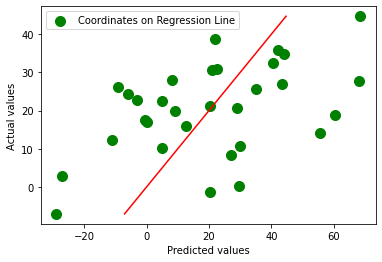

====== SHSS_groups ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.268
Model:                            OLS   Adj. R-squared:                  0.085
Method:                 Least Squares   F-statistic:                     1.467
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.231
Time:                        02:05:23   Log-Likelihood:                -32.988
No. Observations:                  31   AIC:                             79.98
Df Residuals:                      24   BIC:                             90.01
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.0757     

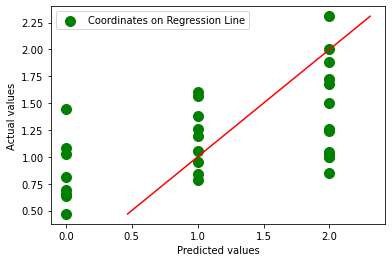

====== auto_groups ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.221
Model:                            OLS   Adj. R-squared:                  0.026
Method:                 Least Squares   F-statistic:                     1.132
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.374
Time:                        02:05:23   Log-Likelihood:                -29.873
No. Observations:                  31   AIC:                             73.75
Df Residuals:                      24   BIC:                             83.78
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.0377     

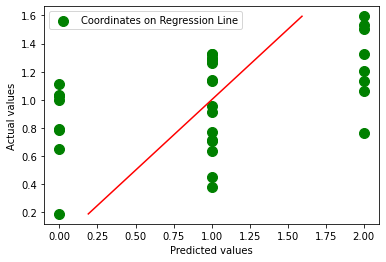

====== SalVentAttnA ======
====== SHSS_score ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.277
Model:                            OLS   Adj. R-squared:                  0.057
Method:                 Least Squares   F-statistic:                     1.259
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.313
Time:                        02:05:24   Log-Likelihood:                -77.700
No. Observations:                  31   AIC:                             171.4
Df Residuals:                      23   BIC:                             182.9
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------


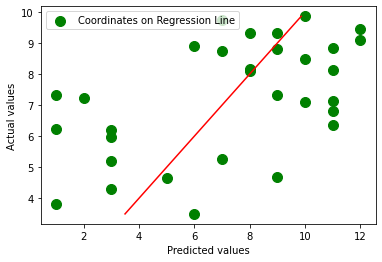

====== raw_change_ANA ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.161
Model:                            OLS   Adj. R-squared:                 -0.095
Method:                 Least Squares   F-statistic:                    0.6283
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.728
Time:                        02:05:24   Log-Likelihood:                -107.97
No. Observations:                  31   AIC:                             231.9
Df Residuals:                      23   BIC:                             243.4
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -5.2278  

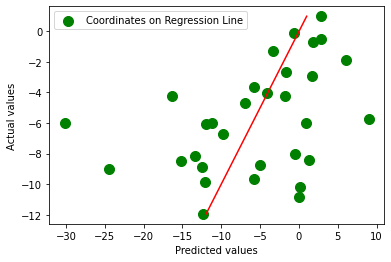

====== raw_change_HYPER ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.172
Model:                            OLS   Adj. R-squared:                 -0.080
Method:                 Least Squares   F-statistic:                    0.6832
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.685
Time:                        02:05:24   Log-Likelihood:                -123.16
No. Observations:                  31   AIC:                             262.3
Df Residuals:                      23   BIC:                             273.8
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         13.6941

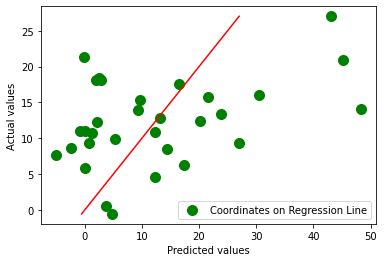

====== total_chge_pain_hypAna ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                 -0.105
Method:                 Least Squares   F-statistic:                    0.5910
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.756
Time:                        02:05:25   Log-Likelihood:                -133.76
No. Observations:                  31   AIC:                             283.5
Df Residuals:                      23   BIC:                             295.0
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         1

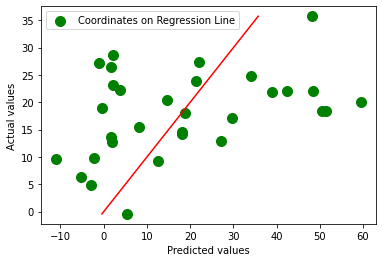

====== Chge_hypnotic_depth ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.050
Model:                            OLS   Adj. R-squared:                 -0.238
Method:                 Least Squares   F-statistic:                    0.1747
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.988
Time:                        02:05:25   Log-Likelihood:                -143.69
No. Observations:                  31   AIC:                             303.4
Df Residuals:                      23   BIC:                             314.8
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         39.7

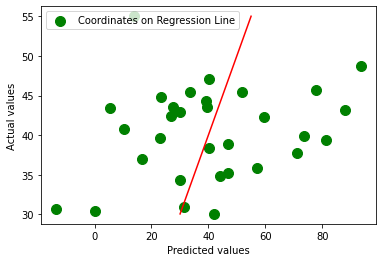

====== Mental_relax_absChange ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.215
Model:                            OLS   Adj. R-squared:                 -0.024
Method:                 Least Squares   F-statistic:                    0.9002
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.523
Time:                        02:05:25   Log-Likelihood:                -132.23
No. Observations:                  31   AIC:                             280.5
Df Residuals:                      23   BIC:                             291.9
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -

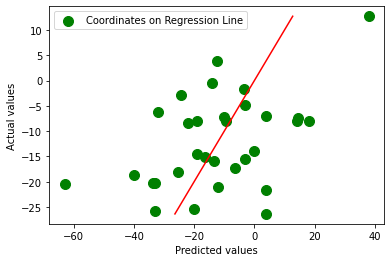

====== Automaticity_post_ind ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.272
Model:                            OLS   Adj. R-squared:                  0.051
Method:                 Least Squares   F-statistic:                     1.230
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.327
Time:                        02:05:26   Log-Likelihood:                -141.63
No. Observations:                  31   AIC:                             299.3
Df Residuals:                      23   BIC:                             310.7
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         52

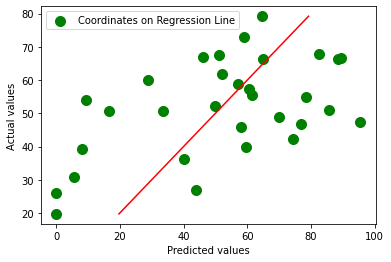

====== Abs_diff_automaticity ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.223
Model:                            OLS   Adj. R-squared:                 -0.014
Method:                 Least Squares   F-statistic:                    0.9407
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.495
Time:                        02:05:26   Log-Likelihood:                -139.85
No. Observations:                  31   AIC:                             295.7
Df Residuals:                      23   BIC:                             307.2
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         24

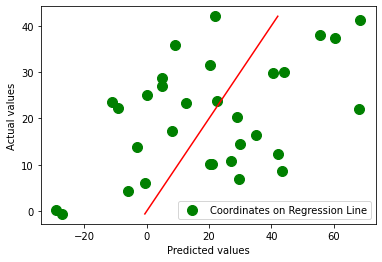

====== SHSS_groups ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.233
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.9972
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.458
Time:                        02:05:27   Log-Likelihood:                -33.723
No. Observations:                  31   AIC:                             83.45
Df Residuals:                      23   BIC:                             94.92
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.0733     

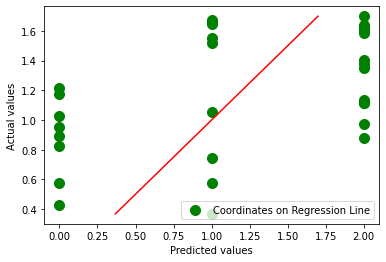

====== auto_groups ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.257
Model:                            OLS   Adj. R-squared:                  0.030
Method:                 Least Squares   F-statistic:                     1.134
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.377
Time:                        02:05:27   Log-Likelihood:                -29.141
No. Observations:                  31   AIC:                             74.28
Df Residuals:                      23   BIC:                             85.75
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.1246     

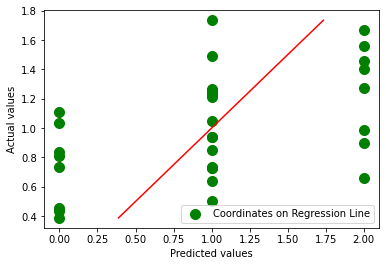

====== DorsAttnB ======
====== SHSS_score ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.208
Model:                            OLS   Adj. R-squared:                 -0.080
Method:                 Least Squares   F-statistic:                    0.7228
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.670
Time:                        02:05:27   Log-Likelihood:                -79.110
No. Observations:                  31   AIC:                             176.2
Df Residuals:                      22   BIC:                             189.1
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
con

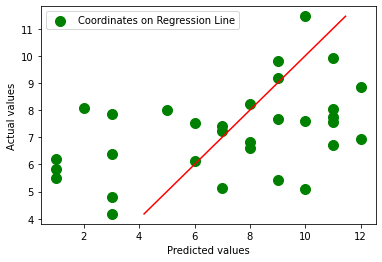

====== raw_change_ANA ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.134
Model:                            OLS   Adj. R-squared:                 -0.181
Method:                 Least Squares   F-statistic:                    0.4258
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.893
Time:                        02:05:28   Log-Likelihood:                -108.45
No. Observations:                  31   AIC:                             234.9
Df Residuals:                      22   BIC:                             247.8
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -5.6076  

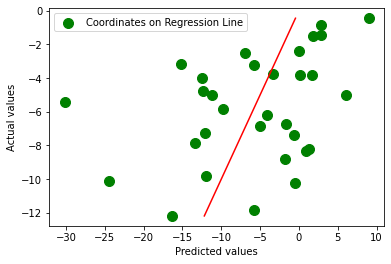

====== raw_change_HYPER ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.409
Model:                            OLS   Adj. R-squared:                  0.194
Method:                 Least Squares   F-statistic:                     1.902
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.111
Time:                        02:05:28   Log-Likelihood:                -117.94
No. Observations:                  31   AIC:                             253.9
Df Residuals:                      22   BIC:                             266.8
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.6411

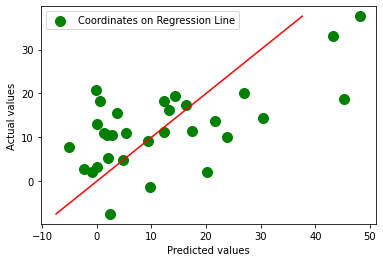

====== total_chge_pain_hypAna ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.251
Model:                            OLS   Adj. R-squared:                 -0.021
Method:                 Least Squares   F-statistic:                    0.9231
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.517
Time:                        02:05:28   Log-Likelihood:                -131.84
No. Observations:                  31   AIC:                             281.7
Df Residuals:                      22   BIC:                             294.6
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         1

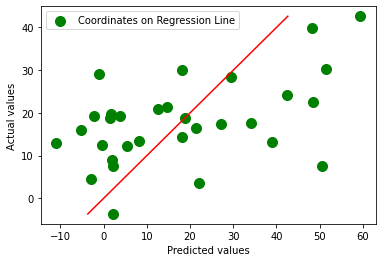

====== Chge_hypnotic_depth ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.145
Model:                            OLS   Adj. R-squared:                 -0.166
Method:                 Least Squares   F-statistic:                    0.4655
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.867
Time:                        02:05:28   Log-Likelihood:                -142.07
No. Observations:                  31   AIC:                             302.1
Df Residuals:                      22   BIC:                             315.0
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         38.8

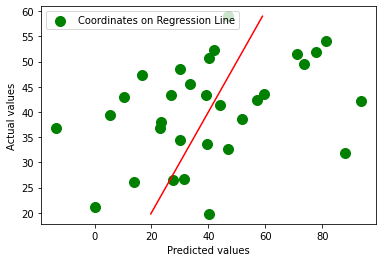

====== Mental_relax_absChange ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.147
Model:                            OLS   Adj. R-squared:                 -0.163
Method:                 Least Squares   F-statistic:                    0.4748
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.861
Time:                        02:05:29   Log-Likelihood:                -133.51
No. Observations:                  31   AIC:                             285.0
Df Residuals:                      22   BIC:                             297.9
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -1

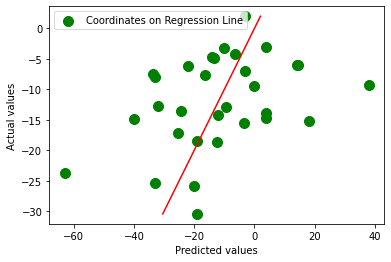

====== Automaticity_post_ind ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.109
Model:                            OLS   Adj. R-squared:                 -0.215
Method:                 Least Squares   F-statistic:                    0.3372
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.942
Time:                        02:05:29   Log-Likelihood:                -144.76
No. Observations:                  31   AIC:                             307.5
Df Residuals:                      22   BIC:                             320.4
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         53

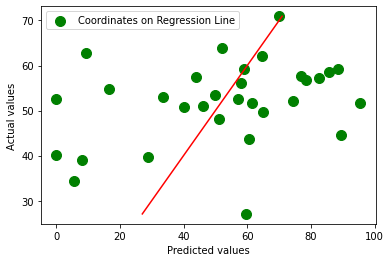

====== Abs_diff_automaticity ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.264
Model:                            OLS   Adj. R-squared:                 -0.003
Method:                 Least Squares   F-statistic:                    0.9887
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.471
Time:                        02:05:29   Log-Likelihood:                -138.99
No. Observations:                  31   AIC:                             296.0
Df Residuals:                      22   BIC:                             308.9
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         21

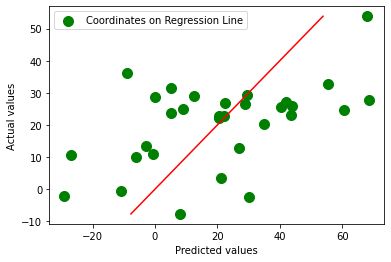

====== SHSS_groups ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.258
Model:                            OLS   Adj. R-squared:                 -0.012
Method:                 Least Squares   F-statistic:                    0.9569
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.493
Time:                        02:05:29   Log-Likelihood:                -33.203
No. Observations:                  31   AIC:                             84.41
Df Residuals:                      22   BIC:                             97.31
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.0977     

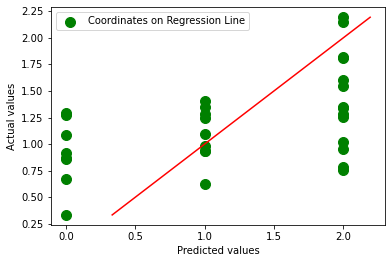

====== auto_groups ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.248
Model:                            OLS   Adj. R-squared:                 -0.026
Method:                 Least Squares   F-statistic:                    0.9057
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.529
Time:                        02:05:30   Log-Likelihood:                -29.323
No. Observations:                  31   AIC:                             76.65
Df Residuals:                      22   BIC:                             89.55
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.0360     

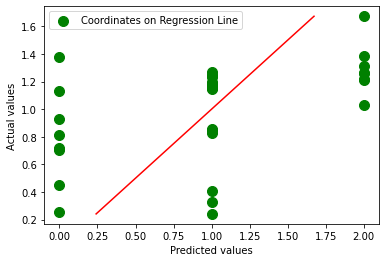

====== SomMotA ======
====== SHSS_score ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.225
Model:                            OLS   Adj. R-squared:                 -0.163
Method:                 Least Squares   F-statistic:                    0.5804
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.811
Time:                        02:05:30   Log-Likelihood:                -78.778
No. Observations:                  31   AIC:                             179.6
Df Residuals:                      20   BIC:                             195.3
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const

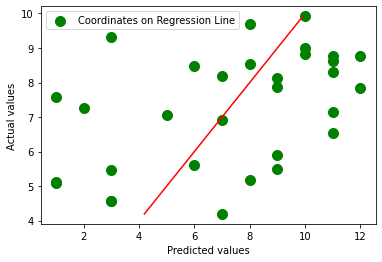

====== raw_change_ANA ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.305
Model:                            OLS   Adj. R-squared:                 -0.043
Method:                 Least Squares   F-statistic:                    0.8770
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.568
Time:                        02:05:30   Log-Likelihood:                -105.05
No. Observations:                  31   AIC:                             232.1
Df Residuals:                      20   BIC:                             247.9
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -6.5780  

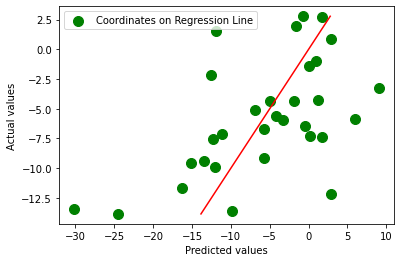

====== raw_change_HYPER ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.406
Model:                            OLS   Adj. R-squared:                  0.110
Method:                 Least Squares   F-statistic:                     1.370
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.263
Time:                        02:05:30   Log-Likelihood:                -118.00
No. Observations:                  31   AIC:                             258.0
Df Residuals:                      20   BIC:                             273.8
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         14.6494

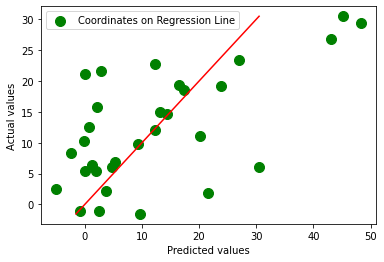

====== total_chge_pain_hypAna ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.328
Model:                            OLS   Adj. R-squared:                 -0.007
Method:                 Least Squares   F-statistic:                    0.9781
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.491
Time:                        02:05:31   Log-Likelihood:                -130.15
No. Observations:                  31   AIC:                             282.3
Df Residuals:                      20   BIC:                             298.1
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         2

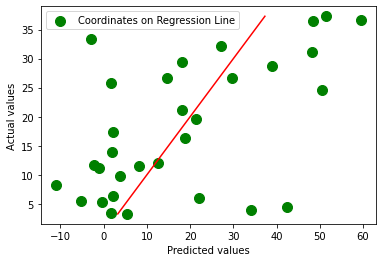

====== Chge_hypnotic_depth ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.255
Model:                            OLS   Adj. R-squared:                 -0.117
Method:                 Least Squares   F-statistic:                    0.6849
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.726
Time:                        02:05:31   Log-Likelihood:                -139.93
No. Observations:                  31   AIC:                             301.9
Df Residuals:                      20   BIC:                             317.6
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         42.1

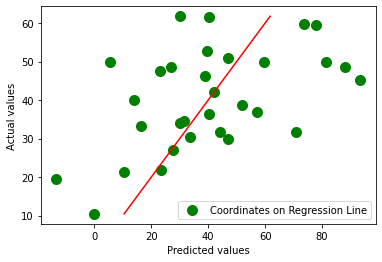

====== Mental_relax_absChange ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.131
Model:                            OLS   Adj. R-squared:                 -0.303
Method:                 Least Squares   F-statistic:                    0.3015
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.972
Time:                        02:05:31   Log-Likelihood:                -133.81
No. Observations:                  31   AIC:                             289.6
Df Residuals:                      20   BIC:                             305.4
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -1

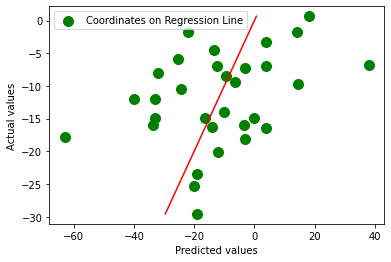

====== Automaticity_post_ind ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.227
Model:                            OLS   Adj. R-squared:                 -0.160
Method:                 Least Squares   F-statistic:                    0.5864
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.806
Time:                        02:05:31   Log-Likelihood:                -142.57
No. Observations:                  31   AIC:                             307.1
Df Residuals:                      20   BIC:                             322.9
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         54

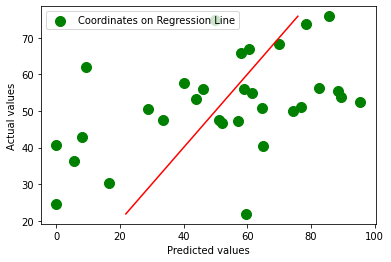

====== Abs_diff_automaticity ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.326
Model:                            OLS   Adj. R-squared:                 -0.012
Method:                 Least Squares   F-statistic:                    0.9652
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.501
Time:                        02:05:31   Log-Likelihood:                -137.65
No. Observations:                  31   AIC:                             297.3
Df Residuals:                      20   BIC:                             313.1
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         23

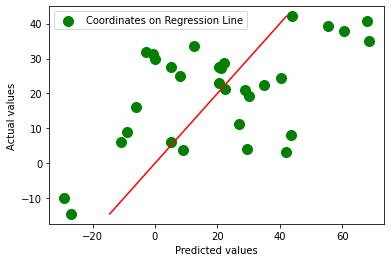

====== SHSS_groups ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.229
Model:                            OLS   Adj. R-squared:                 -0.157
Method:                 Least Squares   F-statistic:                    0.5938
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.800
Time:                        02:05:32   Log-Likelihood:                -33.801
No. Observations:                  31   AIC:                             89.60
Df Residuals:                      20   BIC:                             105.4
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.2349     

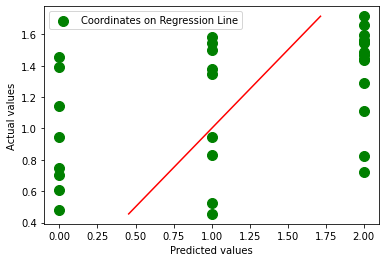

====== auto_groups ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.226
Model:                            OLS   Adj. R-squared:                 -0.160
Method:                 Least Squares   F-statistic:                    0.5853
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.807
Time:                        02:05:32   Log-Likelihood:                -29.757
No. Observations:                  31   AIC:                             81.51
Df Residuals:                      20   BIC:                             97.29
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.0374     

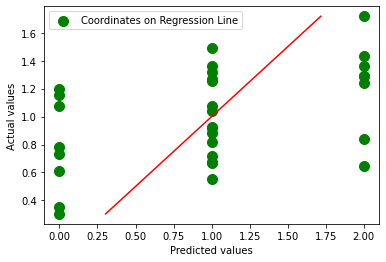

====== No network found ======
====== SHSS_score ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.308
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     1.040
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.442
Time:                        02:05:32   Log-Likelihood:                -77.012
No. Observations:                  31   AIC:                             174.0
Df Residuals:                      21   BIC:                             188.4
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------

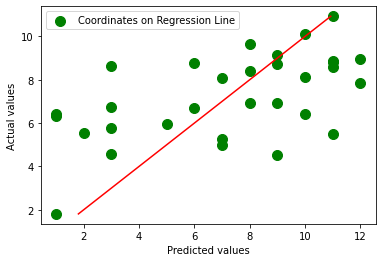

====== raw_change_ANA ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.373
Model:                            OLS   Adj. R-squared:                  0.105
Method:                 Least Squares   F-statistic:                     1.389
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.254
Time:                        02:05:32   Log-Likelihood:                -103.44
No. Observations:                  31   AIC:                             226.9
Df Residuals:                      21   BIC:                             241.2
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -7.3314  

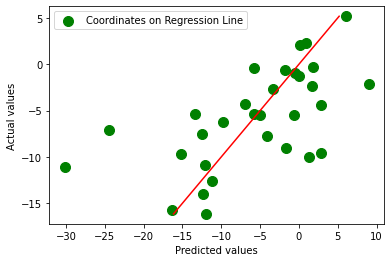

====== raw_change_HYPER ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.287
Model:                            OLS   Adj. R-squared:                 -0.019
Method:                 Least Squares   F-statistic:                    0.9385
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.514
Time:                        02:05:33   Log-Likelihood:                -120.85
No. Observations:                  31   AIC:                             261.7
Df Residuals:                      21   BIC:                             276.0
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         13.9287

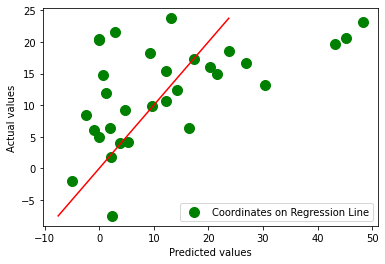

====== total_chge_pain_hypAna ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.360
Model:                            OLS   Adj. R-squared:                  0.085
Method:                 Least Squares   F-statistic:                     1.311
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.289
Time:                        02:05:33   Log-Likelihood:                -129.41
No. Observations:                  31   AIC:                             278.8
Df Residuals:                      21   BIC:                             293.2
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         2

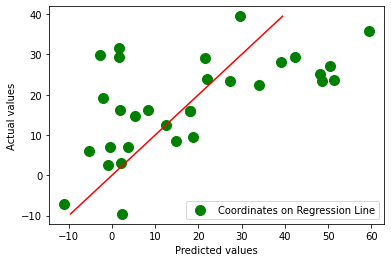

====== Chge_hypnotic_depth ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.355
Model:                            OLS   Adj. R-squared:                  0.078
Method:                 Least Squares   F-statistic:                     1.282
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.303
Time:                        02:05:34   Log-Likelihood:                -137.71
No. Observations:                  31   AIC:                             295.4
Df Residuals:                      21   BIC:                             309.8
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         44.8

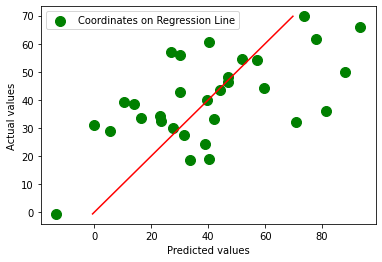

====== Mental_relax_absChange ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.254
Model:                            OLS   Adj. R-squared:                 -0.065
Method:                 Least Squares   F-statistic:                    0.7956
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.624
Time:                        02:05:34   Log-Likelihood:                -131.43
No. Observations:                  31   AIC:                             282.9
Df Residuals:                      21   BIC:                             297.2
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -1

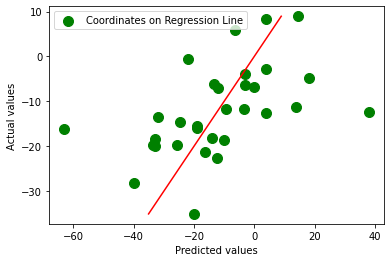

====== Automaticity_post_ind ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.125
Model:                            OLS   Adj. R-squared:                 -0.250
Method:                 Least Squares   F-statistic:                    0.3334
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.954
Time:                        02:05:34   Log-Likelihood:                -144.49
No. Observations:                  31   AIC:                             309.0
Df Residuals:                      21   BIC:                             323.3
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         55

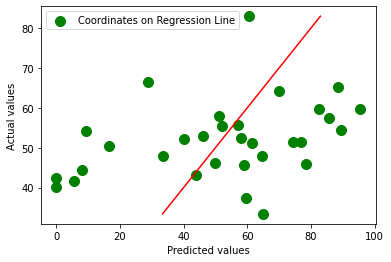

====== Abs_diff_automaticity ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.323
Model:                            OLS   Adj. R-squared:                  0.032
Method:                 Least Squares   F-statistic:                     1.111
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.397
Time:                        02:05:34   Log-Likelihood:                -137.72
No. Observations:                  31   AIC:                             295.4
Df Residuals:                      21   BIC:                             309.8
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         22

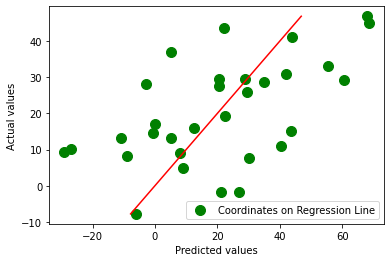

====== SHSS_groups ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.256
Model:                            OLS   Adj. R-squared:                 -0.064
Method:                 Least Squares   F-statistic:                    0.8010
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.620
Time:                        02:05:35   Log-Likelihood:                -33.257
No. Observations:                  31   AIC:                             86.51
Df Residuals:                      21   BIC:                             100.9
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.2549     

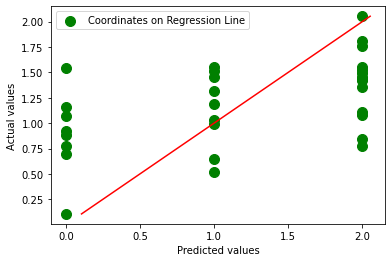

====== auto_groups ======
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.273
Model:                            OLS   Adj. R-squared:                 -0.038
Method:                 Least Squares   F-statistic:                    0.8780
Date:                Thu, 19 Oct 2023   Prob (F-statistic):              0.559
Time:                        02:05:35   Log-Likelihood:                -28.785
No. Observations:                  31   AIC:                             77.57
Df Residuals:                      21   BIC:                             91.91
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.0968     

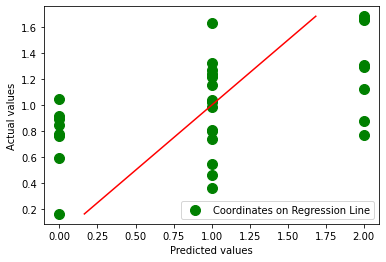

In [173]:
import statsmodels.api as sm
# Assuming your DataFrame is named 'df' and the tag variable is in a list named 'networks'
# Zip the column names with the networks

metric_name = 'degree'
network_of_interest =  ['DefaultB','VisCent'] 
networks = yeo7id
for pred_network in network_colors:
    print('======', pred_network, '======')
    #for metric_name in list(graph_dict['change_feat'].keys()):
    for column in Y.columns:
        y = np.array(Y[column]).astype('float64')
        df = change_gmetrics[metric_name]
        print('======', column, '======')

        # Zip the column names with the networks
        columns_with_networks = zip(df.columns, networks)
        # Filter out the columns that don't have the network tag
        selected_columns = []
        for column, tag in columns_with_networks:
            if tag in  pred_network:
                selected_columns.append(column)

        # Select the desired columns from the DataFrame
        selected_df = np.array(df[selected_columns]).astype('float64')
        X = sm.add_constant(selected_df)
        # Fit the OLS model
        model = sm.OLS(y, X).fit()

        # Print the summary of the OLS regression
        print(model.summary())

        # Access beta coefficients and p-values
        betas = model.params
        p_values = model.pvalues

        # Print the beta coefficients and p-values
        selected_columns.insert(0, 'Constant')
        #for feature, beta, p_value in zip(selected_columns, betas, p_values):
        #    print(f"Feature: {feature}, Beta: {beta}, P-value: {p_value}")
        #import matplotlib.pyplot as plt

        # Predicted values (assuming you've already performed multiple linear regression)
        Y_pred = np.dot(X, model.params)
        # Plot the coordinates of Y_pred along the regression line
        plt.scatter(y, Y_pred, color='green', label='Coordinates on Regression Line', s=100)
        plt.xlabel('Predicted values')
        plt.ylabel('Actual values')
        plt.legend()
        # Trace the regression line
        regression_line = np.poly1d(np.polyfit(Y_pred, y, 1))
        Y_pred_regression = np.linspace(min(Y_pred), max(Y_pred), 100)  # Generate points for the regression line

        plt.plot(Y_pred_regression, regression_line(Y_pred_regression), color='red', label='Regression Line')
        plt.show()





======= SHSS_score =======


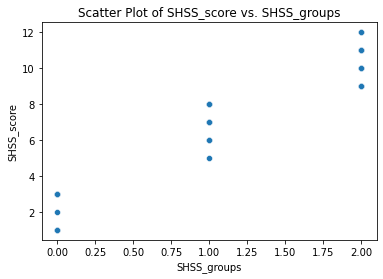

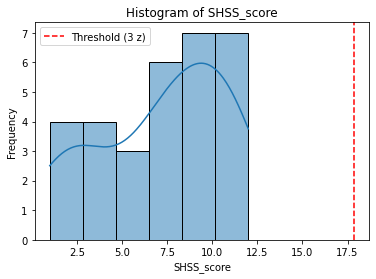

No extreme scores found.
-------------------


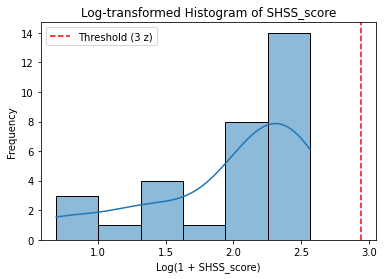

======= raw_change_ANA =======


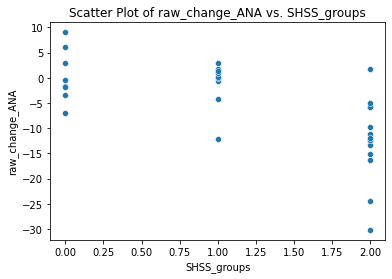

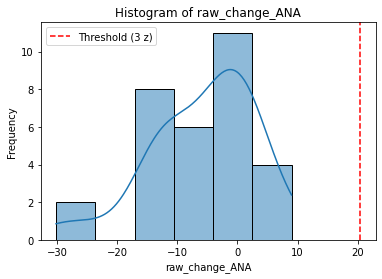

No extreme scores found.
-------------------


c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


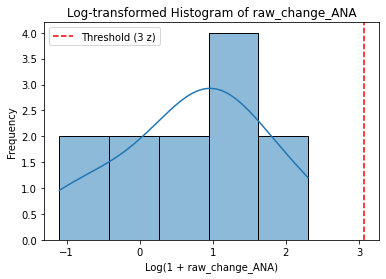

======= raw_change_HYPER =======


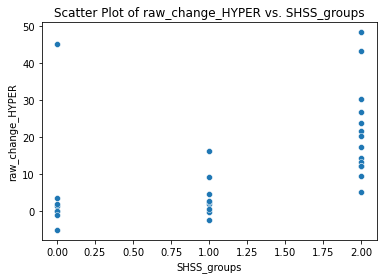

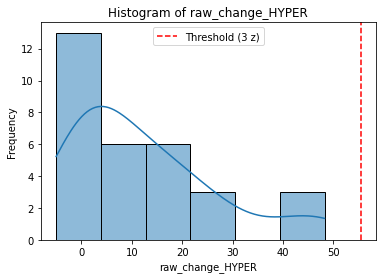

No extreme scores found.
-------------------


c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


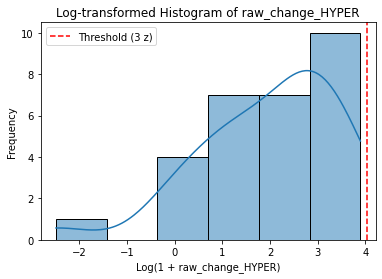

======= total_chge_pain_hypAna =======


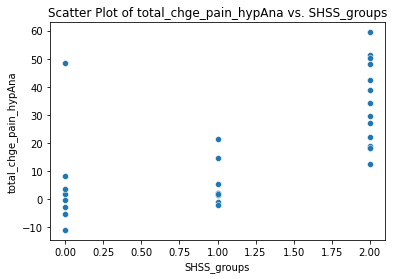

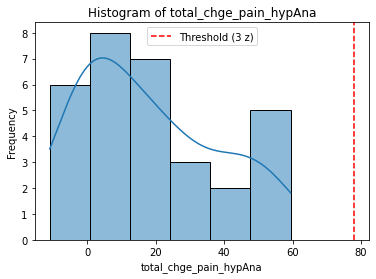

No extreme scores found.
-------------------


c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


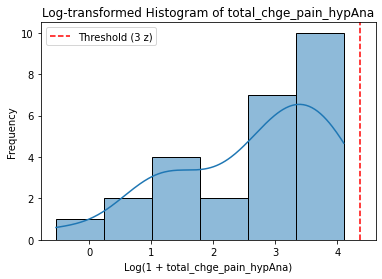

======= Chge_hypnotic_depth =======


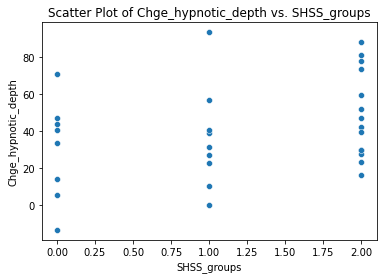

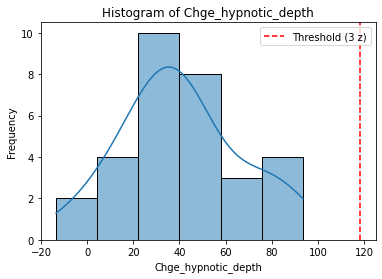

No extreme scores found.
-------------------


c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


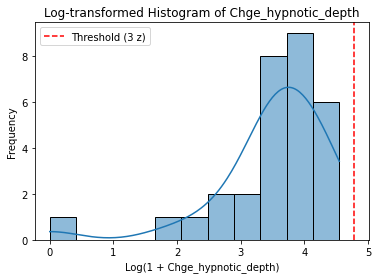

======= Mental_relax_absChange =======


KeyboardInterrupt: 

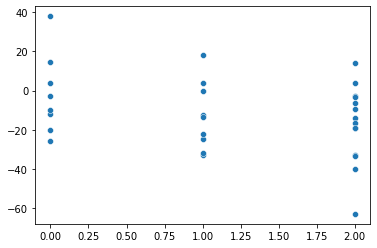

In [8]:
# check linearity of VD
Y = Y.apply(pd.to_numeric, errors='coerce')
Y = Y.dropna()
# Compute z-scores for each dependent variable
z_scores = (Y - Y.mean()) / Y.std()
# Set the threshold for extreme scores
z_threshold = 3
# Iterate through each dependent variable
for column in Y.columns:
    print(f"======= {column} =======")

    # Scatter plot of the dependent variable against SHSS_groups
    sns.scatterplot(data=Y, x='SHSS_groups', y=column)
    plt.xlabel('SHSS_groups')
    plt.ylabel(column)
    plt.title(f"Scatter Plot of {column} vs. SHSS_groups")
    plt.show()

    # Histogram of the dependent variable
    sns.histplot(Y[column], kde=True)
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.title(f"Histogram of {column}")
    plt.axvline(x=Y[column].mean() + z_threshold * Y[column].std(), color='red', linestyle='--', label=f'Threshold ({z_threshold} z)')
    plt.legend()
    plt.show()

    # Check for extreme scores with z values > 3
    extreme_scores = Y[np.abs(z_scores[column]) > z_threshold]
    if len(extreme_scores) > 0:
        print(f"Extreme Scores (> {z_threshold} z) for {column}:")
        print(extreme_scores)
    else:
        print("No extreme scores found.")

    print("-------------------")

    # Log-transformed histogram
    log_transformed_column = np.log1p(Y[column])
    sns.histplot(log_transformed_column, kde=True)
    plt.xlabel(f'Log(1 + {column})')
    plt.ylabel('Frequency')
    plt.title(f"Log-transformed Histogram of {column}")
    plt.axvline(x=np.log1p(Y[column].mean() + z_threshold * Y[column].std()), color='red', linestyle='--', label=f'Threshold ({z_threshold} z)')
    plt.legend()
    plt.show()


Connectivity matrix


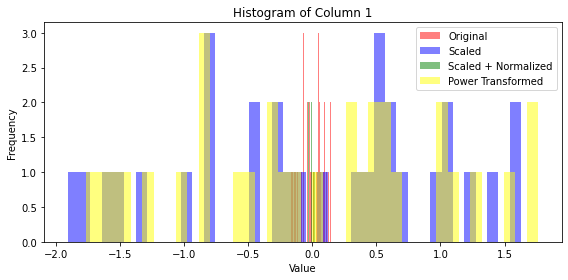

Degree


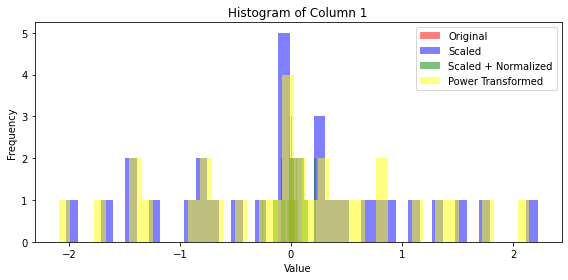

Degree_centrality


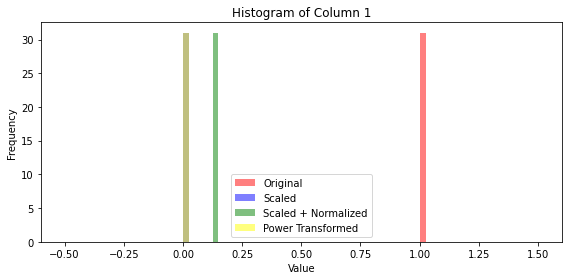

Closeness centrality


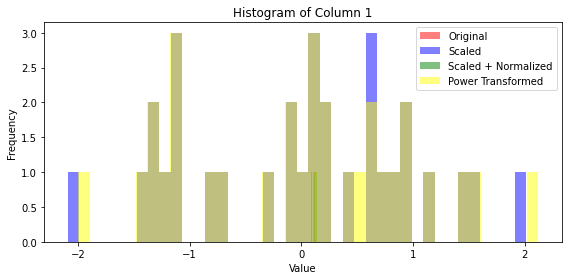

Betweenness centrality


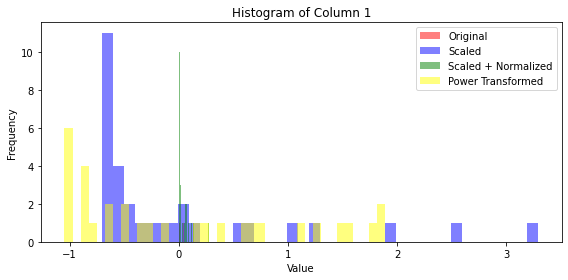

Clustering


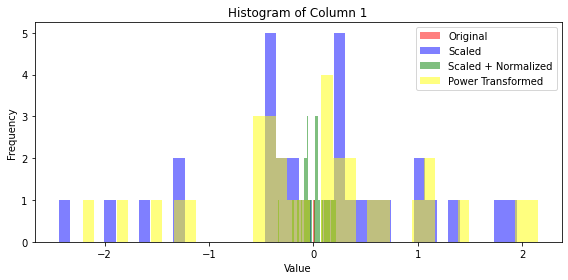

In [596]:
# Distribution of graph features

for features_matrix, g_metric in zip([X_con, X_degree,X_degreeCentrality, X_closeness, X_betweenness, X_clustering], ['Connectivity matrix', 'Degree','Degree_centrality', 'Closeness centrality', 'Betweenness centrality', 'Clustering']):
    print('================ \n{}\n================'.format(g_metric))
    
    
    feature_matrix = np.mean(feature_matrices,axis=0).reshape(-1, 1)
    # Scaling and normalization
    scaled_features_matrix = StandardScaler().fit_transform(features_matrix)
    normalized_features_matrix = normalize(features_matrix)#Pipeline([('scaler', StandardScaler()), ('norm', normalize())]).fit_transform(features_matrix)
    power_transformed_matrix = PowerTransformer().fit_transform(features_matrix)
    powerScaled_features_matrix = StandardScaler().fit_transform(power_transformed_matrix)
    # Plot settings
    num_columns = concatenated_matrices.shape[1]
    fig, axes = plt.subplots(nrows=num_columns, ncols=1, figsize=(8, 4 * num_columns))
    colors = ['red', 'blue', 'green', 'yellow']

    # Plot each column's distributions
    i=0
    ax = axes#[i]
    column_data = features_matrix[:, i]
    ax.hist(column_data, bins=40, color=colors[0], alpha=0.5, label='Original')
    ax.hist(scaled_features_matrix[:, i], bins=40, color=colors[1], alpha=0.5, label='Scaled')
    ax.hist(normalized_features_matrix[:, i], bins=40, color=colors[2], alpha=0.5, label='Scaled + Normalized')
    ax.hist(power_transformed_matrix[:, i], bins=40, color=colors[3], alpha=0.5, label='Power Transformed')

    ax.set_title(f"Histogram of Column {i + 1}")
    ax.set_xlabel("Value")
    ax.set_ylabel("Frequency")
    ax.legend()

    plt.tight_layout()
    plt.show()


Connectivity matrix
Features matrix shape: (31, 2016)
Correlation matrix shape: (2016, 2016)


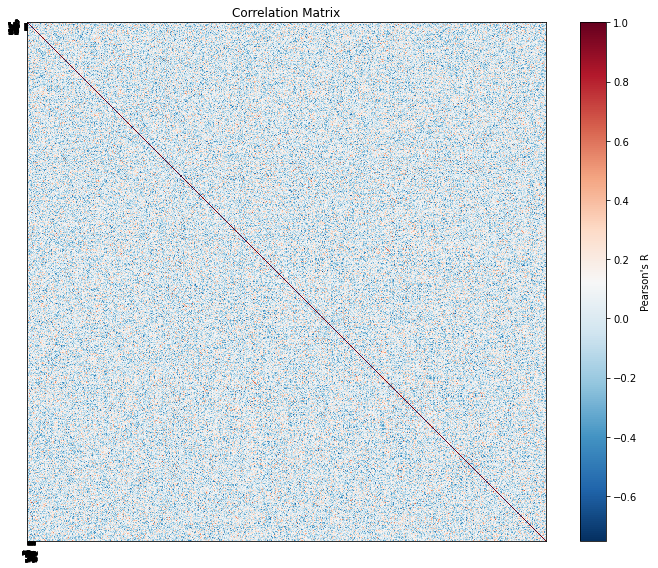

Degree
Features matrix shape: (31, 64)
Correlation matrix shape: (64, 64)


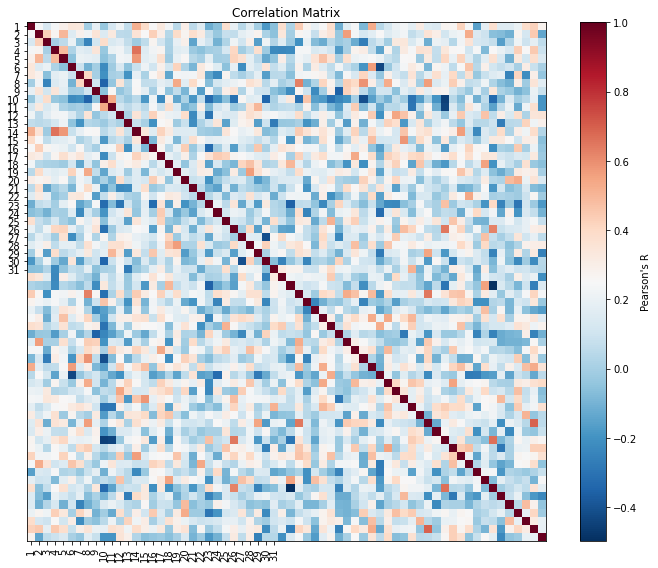

Closeness centrality
Features matrix shape: (31, 64)
Correlation matrix shape: (64, 64)


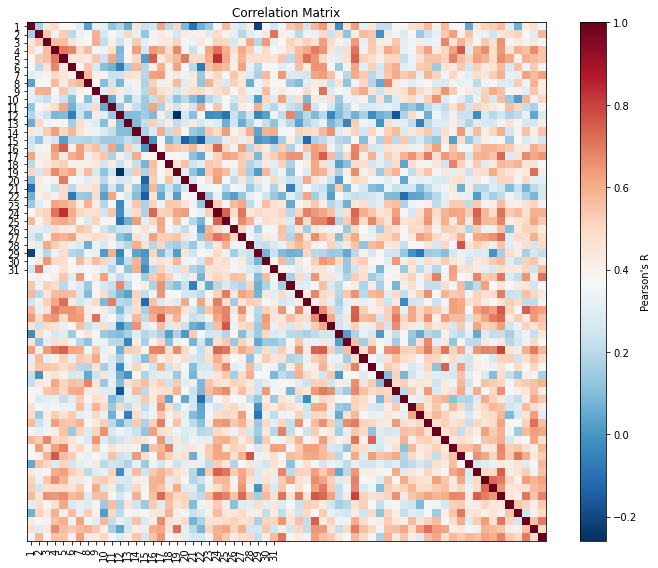

Betweenness centrality
Features matrix shape: (31, 64)
Correlation matrix shape: (64, 64)


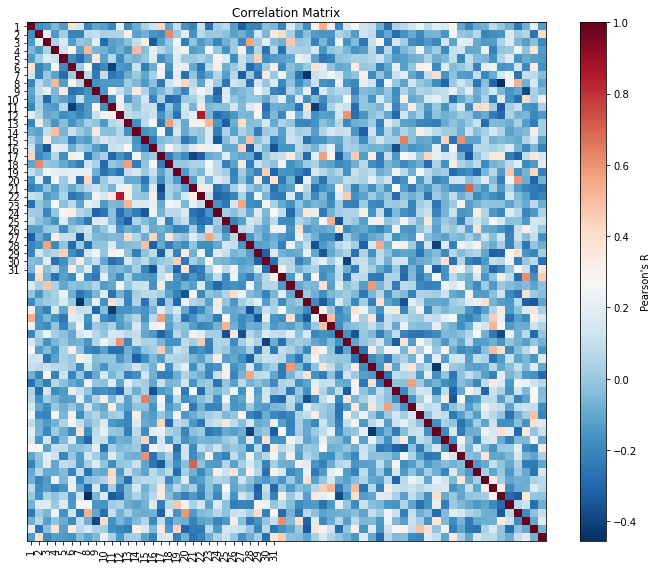

Clustering
Features matrix shape: (31, 64)
Correlation matrix shape: (64, 64)


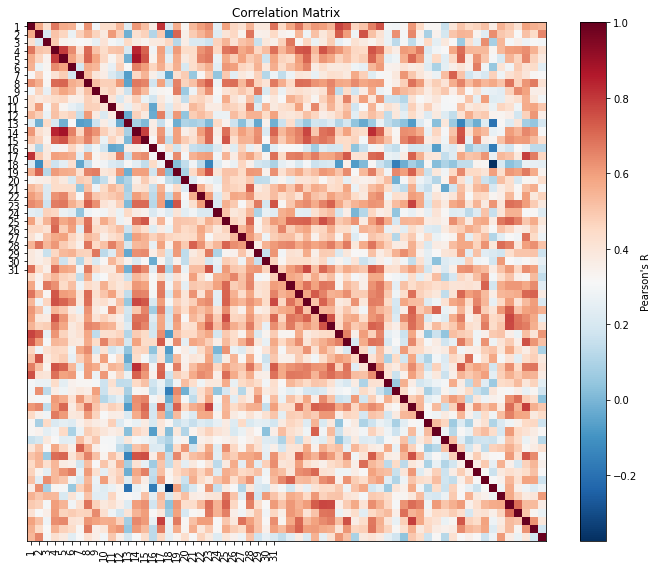

In [550]:
#checking the correlation between the features
for rawfeatures_matrix, g_metric in zip([X_con, X_degree, X_closeness, X_betweenness, X_clustering], ['Connectivity matrix', 'Degree', 'Closeness centrality', 'Betweenness centrality', 'Clustering']):
    print('================ \n{}\n================'.format(g_metric))
    print('Features matrix shape: {}'.format(rawfeatures_matrix.shape))
    correlation_matrix = np.corrcoef(rawfeatures_matrix, rowvar=False)
    print('Correlation matrix shape: {}'.format(correlation_matrix.shape))
    # Plot the correlation matrix
    plt.figure(figsize=(10, 8))
    plt.imshow(correlation_matrix, cmap='RdBu_r', interpolation='nearest')
    plt.colorbar(label="Pearson's R")
    plt.title('Correlation Matrix')
    plt.xticks(range(len(features_matrix)), range(1, len(features_matrix) + 1), rotation='vertical')
    plt.yticks(range(len(features_matrix)), range(1, len(features_matrix) + 1))
    plt.tight_layout()
    plt.show()


Functions for plotting CV results

In [190]:
def reg_plot_performance(y_test, y_pred, y_name, mean_pearson_r, mean_rmse, mean_r2, mean_r2_pval,rmse_p_value, mean_comp, title='', path_output='', filename='regplot'):
    """
    Plot the regression plot associated with the model performance. One regression line will be plotted per fold.

    Parameters
    ----------
    y_test: list
        list containing the values of y in the test set for each fold
    y_pred: list
        list containing the values of the predicted y for each fold
    y_name: string
        name of the target variable (Y-axis label)
    mean_pearson_r: float
        mean Pearson's R value
    mean_rmse: float
        mean RMSE value
    mean_r2: float
        mean R^2 value
    mean_r2_pval: float
        mean p-value for R^2
    rmse_p_value : float
        mean p-value for RMSE
    mean_comp: float
        mean number of components
    path_output: string
        path for saving the output
    filename: string
        name of the output file

    Code adapted from https://github.com/mpcoll/coll_painvalue_2021/tree/main/figures
    """
    import matplotlib.ticker as ticker

    blue_palette_10 = sns.color_palette("Blues", 10)
    fig1, ax1 = plt.subplots(figsize=(5, 5))
    ax1.set_xlim([min([min(y) for y in y_test]), max([max(y) for y in y_test])])
    ax1.set_ylim([min([min(y) for y in y_test]), max([max(y) for y in y_test])])
    for idx, elem in enumerate(y_test):
        df = pd.DataFrame(list(zip(elem, y_pred[idx])), columns=['Y_true', 'Y_pred'])
        sns.regplot(data=df, x='Y_true', y='Y_pred',
                    ci=None, scatter=False, color=blue_palette_10[idx],
                    ax=ax1, line_kws={'linewidth': 1.4}, truncate=False)
        ax1.xaxis.set_major_locator(ticker.AutoLocator())
        ax1.yaxis.set_major_locator(ticker.AutoLocator())
    plt.xlabel(y_name)
    plt.ylabel('Cross-validated prediction')
    for axis in ['top', 'bottom', 'left', 'right']:
        ax1.spines[axis].set_linewidth(2.6)
    ax1.tick_params(width=2.6, direction='out', length=10)
    plt.title(title)

    # Add metrics at the bottom
    metrics_text = f"Mean Pearson's R: {mean_pearson_r:.4f}\nMean RMSE: {mean_rmse:.4f} (p={rmse_p_value:.4f})\nMean R^2: {mean_r2:.4f} (p={mean_r2_pval:.4f})\nMean PCA components: {mean_comp}"
    plt.text(0.49, 0.05, metrics_text, ha='left', transform=ax1.transAxes, fontsize=  9)

    plt.show()


from sklearn.model_selection import permutation_test_score

def compute_permutation(X, y, pipeline,gr=None,cv = None, n_components=0.80, n_permutations=5000, scoring="r2", random_seed=40):
    """
    Compute the permutation test for a specified metric (r2 by default)
    Apply the PCA after the splitting procedure

    Parameters
    ----------
    X: predictive variable
    y: predicted variable
    n_components: number of components to keep for the PCA
    n_permutations: number of permuted iteration
    scoring: scoring strategy
    random_seed: controls the randomness

    Returns
    ----------
    score (float): true score
    perm_scores (ndarray): scores for each permuted samples
    pvalue (float): probability that the true score can be obtained by chance

    See also scikit-learn permutation_test_score documentation
    """
    if gr == None and cv == None:
        cv = kf = KFold(n_splits=5, random_state=random_seed, shuffle=True)
 #ShuffleSplit(n_splits = 5, test_size = 0.3, random_state = random_seed)
    elif gr != None and cv == None:     
        cv = GroupShuffleSplit(n_splits = 5, test_size = 0.3, random_state = random_seed)
    
    score, perm_scores, pvalue = permutation_test_score(estimator=pipeline, X=X, y=y, scoring=scoring, cv=cv, n_permutations=n_permutations, random_state=random_seed)
    
    return score, perm_scores, pvalue


SVR predictions 

In [203]:
print(reg_dict.keys())
change_pred = reg_dict['change']
print(change_pred.keys())
pred_degree = change_pred['Degree']
pred_closeness = change_pred['Closeness']
pred_betweenness = change_pred['Betweenness']
print(pred_degree.keys())

dict_keys(['pre', 'post', 'change', 'behavioral'])
dict_keys(['Degree', 'Closeness', 'Betweenness'])
dict_keys(['SHSS_score', 'raw_change_ANA', 'raw_change_HYPER', 'total_chge_pain_hypAna', 'Chge_hypnotic_depth', 'Mental_relax_absChange', 'Automaticity_post_ind', 'Abs_diff_automaticity'])


In [251]:
change_pred['Degree']['raw_change_ANA'].keys()
print(con_dict.keys())
print(graph_dict.keys())
pred_dict.keys()

dict_keys(['subjects', 'pre_series', 'post_series', 'seed_pre_series', 'seed_post_series', 'seed_to_pre_correlations', 'seed_to_post_correlations', 'pre_connectomes', 'post_connectomes', 'diff_weight_connectomes'])
dict_keys(['pre', 'post', 'change', 'pre_metrics', 'post_metrics', 'change_feat', 'Y'])


dict_keys(['plot_title', 'CV_mse', 'CV_rmse', 'CV_r2', 'CV_pearson_r', 'pca_n_components', 'r2p_value', 'rmse_p_value', 'y_preds', 'y_tests', 'corr_coeffs'])

====== Degree ======
dict_keys(['SHSS_score', 'raw_change_ANA', 'raw_change_HYPER', 'total_chge_pain_hypAna', 'Chge_hypnotic_depth', 'Mental_relax_absChange', 'Automaticity_post_ind', 'Abs_diff_automaticity'])
====== Closeness ======
dict_keys(['SHSS_score', 'raw_change_ANA', 'raw_change_HYPER', 'total_chge_pain_hypAna', 'Chge_hypnotic_depth', 'Mental_relax_absChange', 'Automaticity_post_ind', 'Abs_diff_automaticity'])
====== Betweenness ======
dict_keys(['SHSS_score', 'raw_change_ANA', 'raw_change_HYPER', 'total_chge_pain_hypAna', 'Chge_hypnotic_depth', 'Mental_relax_absChange', 'Automaticity_post_ind', 'Abs_diff_automaticity'])


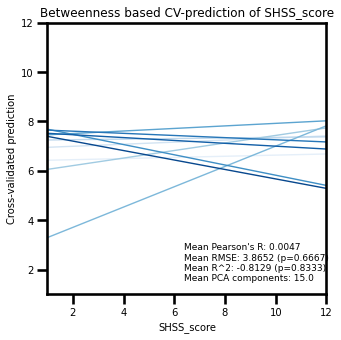

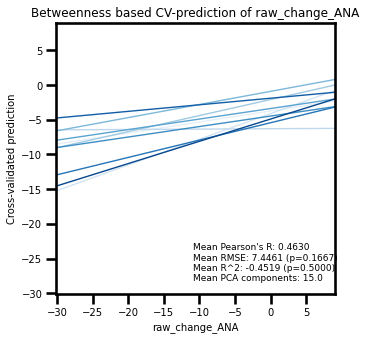

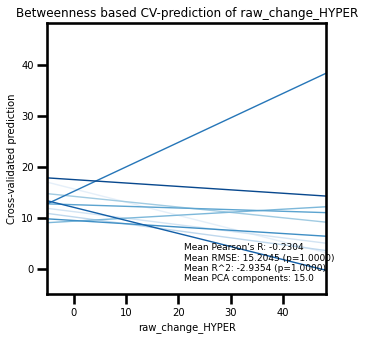

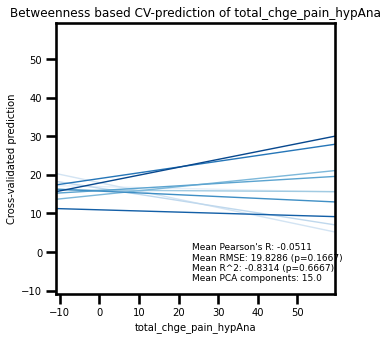

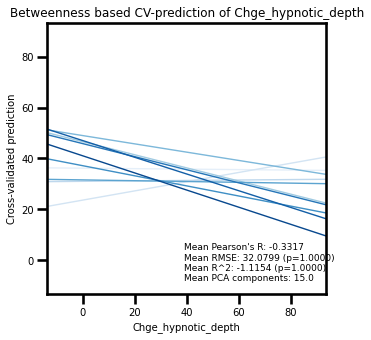

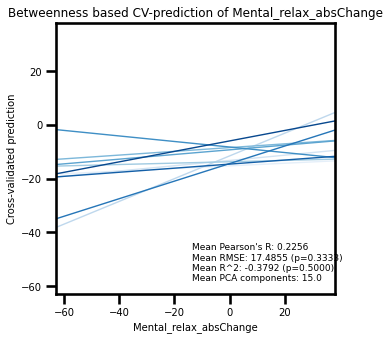

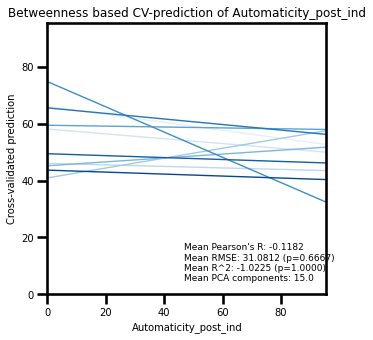

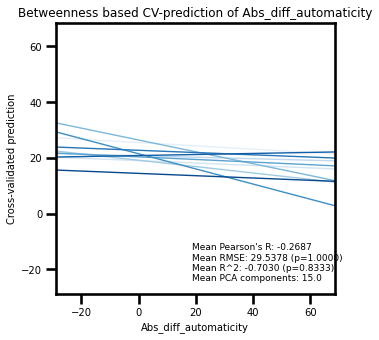

In [218]:
#SVR model for each graph metric
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from scipy.stats import pearsonr
import numpy as np

# reg_plot_performance(y_test, y_pred, y_name, mean_pearson_r, mean_rmse, mean_r2, mean_r2_pval,rmse_p_value, mean_comp, title='', path_output='', filename='regplot'):
for gmetrics in list(reg_dict['change'].keys()):
    print('======', gmetrics, '======')
    g_dict = reg_dict['change'][gmetrics]
    print(g_dict.keys())
for target_column in g_dict.keys():
    pred_dict = g_dict[target_column]
    y_tests = pred_dict['y_tests']
    y_preds = pred_dict['y_preds']
    mean_pearson_r = np.mean(pred_dict['CV_pearson_r'])
    mean_rmse = np.mean(pred_dict['CV_rmse'])
    mean_mse = np.mean(pred_dict['CV_mse'])
    mean_r2 = np.mean(pred_dict['CV_r2'])
    mean_n_components = np.mean(pred_dict['pca_n_components'])
    plot_title = pred_dict['plot_title']
    mean_r2_pval = pred_dict['r2p_value']
    rmse_p_value = pred_dict['rmse_p_value']
    reg_plot_performance(y_tests, y_preds, target_column, mean_pearson_r, mean_rmse, mean_r2, mean_r2_pval, rmse_p_value, mean_n_components, title = plot_title)


In [230]:
out = pred_degree['raw_change_ANA']
print(out.keys())
coeffs = np.stack(out['corr_coeffs'],axis=-1)
out['corr_coeffs'][0].shape

dict_keys(['plot_title', 'CV_mse', 'CV_rmse', 'CV_r2', 'CV_pearson_r', 'pca_n_components', 'r2p_value', 'rmse_p_value', 'y_preds', 'y_tests', 'corr_coeffs'])


(1, 2016)

Ridge model

In [16]:
# Imports 
from sklearn.cross_decomposition import PLSRegression
from scipy.stats import pearsonr
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.decomposition import PCA, SparsePCA, FastICA
from sklearn.model_selection import ShuffleSplit, GridSearchCV, KFold, StratifiedKFold, StratifiedShuffleSplit
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, QuantileTransformer, PowerTransformer
from sklearn.linear_model import Ridge, Lasso, LinearRegression
from sklearn.linear_model import RidgeCV
from statsmodels.stats.multitest import fdrcorrection
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline


In [82]:
# Ridge model and output for each graph metric and dependent variable
#feature_matrices = [X_degree, X_degreeCentrality, X_closeness, X_betweenness, X_clustering]
#concatenated_matrices = np.vstack(feature_matrices)
#num_participants = X_degree.shape[0]
#group_column = np.tile(np.arange(1, num_participants + 1), len(feature_matrices)

random_seed = 0
result_dict = dict()
result_per_col = dict()
for rawfeatures_matrix, g_metric in zip([X_con, X_degree, X_closeness, X_betweenness, X_clustering], ['Connectivity matrix', 'Degree', 'Closeness centrality', 'Betweenness centrality', 'Clustering']):
    print('================ \n{}\n================'.format(g_metric))
    
    prePipeline = Pipeline([('scaler', StandardScaler())])
    features_matrix = prePipeline.fit_transform(rawfeatures_matrix)

    #pipeline = Pipeline([('std', QuantileTransformer(n_quantiles=22)), ('pca', PCA(n_components=0.80)), ('ridge', Ridge())])
    pipeline = Pipeline([('pca', PCA(n_components=0.90)), ('reg', SVR(kernel='linear'))])
    #cv = KFold(n_splits=5, random_state=random_seed, shuffle=True)
    cv = StratifiedShuffleSplit(n_splits=10, test_size=0.20, random_state=random_seed)

    for target_column in target_columns:
        print(f"--- {target_column} ---")
        y_preds = []
        y_tests = []
        y = Y[target_column].values
        # Add covariates to the feature matrix (?!!)
        add_cov = False
        #if  target_column != 'SHSS_score':
            #add_cov = True
            #covariate_column = 'SHSS_score'
        '''
        if target_column != 'SHSS_score':
            covariate_column = 'Abs_diff_automaticity'
            add_cov = True
        if add_cov:    
            features_matrix = np.hstack((features_matrix, Y[covariate_column].values.reshape(-1, 1)))
            covariate_corr, p_value = pearsonr(Y[covariate_column], y)
            p_value_corrected = fdrcorrection([p_value])[1][0]  # Apply FDR correction
            print(f"Pearson correlation between {covariate_column} and {target_column}:\n r={covariate_corr:.4f} (FDR corrected p-value: p={p_value_corrected:.4f})")
        '''
        
        pearson_r_scores = []
        r2_scores = []
        mse_scores = []
        rmse_scores = []
        n_components = []
        all_coefficients = []
        
        for train_index, test_index in cv.split(features_matrix, Y['SHSS_groups'].values):
            # Split the data into train and test sets based on the current fold
            X_train, X_test = features_matrix[train_index], features_matrix[test_index]
            y_train, y_test = y[train_index], y[test_index]
            # Fit pipeline model with best hyperparameters
            pipeline.fit(X_train, y_train)
            y_pred = pipeline.predict(X_test)
            y_preds.append(y_pred)
            y_tests.append(y_test)

            # Calculate evaluation metrics
            pearson_r, _ = pearsonr(y_test, y_pred)
            r2 = r2_score(y_test, y_pred)
            mse = mean_squared_error(y_test, y_pred)
            rmse = np.sqrt(mse)
            #Covariance for Haufe correction
            cov_x = np.cov(pipeline.named_steps['pca'].transform(X_test).transpose().astype(np.float64))
            cov_y = np.cov(y_test.transpose().astype(np.float64))
     
            # Append metrics to the respective lists
            pearson_r_scores.append(pearson_r)
            r2_scores.append(r2)
            mse_scores.append(mse)
            rmse_scores.append(rmse)
            n_components.append(pipeline.named_steps['pca'].n_components_)
            coefficients = pipeline.named_steps['reg'].coef_
    
            # correction from Eqn 6 (Haufe et al., 2014)
            corr_coeffs = np.matmul(cov_x, coefficients.transpose()) * (
                1 / cov_y   
            )
            all_coefficients.append(pipeline.named_steps['pca'].inverse_transform(corr_coeffs.transpose()))
            
        
        #Permutation tests
        #r2score, _, r2p_value = compute_permutation(features_matrix, y, pipeline, cv = cv, scoring='r2', random_seed=random_seed)
        #rmse_score, _, rmse_p_value = compute_permutation(features_matrix, y, pipeline, cv = cv, scoring='neg_root_mean_squared_error', random_seed=random_seed)
        r2p_value,rmse_p_value = 0.00001, 0.00001
        
        print(f"Permutation test for r2 values: p={r2p_value:.4f}")
        # Calculate mean metrics across all folds
        mean_pearson_r = np.mean(pearson_r_scores)
        mean_r2 = np.mean(r2_scores)
        mean_mse = np.mean(mse_scores)
        mean_rmse = np.mean(rmse_scores)
        mean_n_components = np.mean(n_components)

        result_per_col[target_column] = {
                "plot_title": plot_title,
                "mean_mse": mean_mse,
                "mean_rmse": mean_rmse,
                "mean_r2": mean_r2,
                "mean_pearson_r": mean_pearson_r,
                "mean_n_components": mean_n_components,
                "r2p_value": r2p_value,
                "rmse_p_value": rmse_p_value,
                "y_preds": y_preds,
                "y_tests": y_tests,
                "corr_coeffs": all_coefficients,
            }

    result_dict[g_metric] = result_per_col
        # Calculate standard deviation metrics across all folds
        # avg_z_score = np.mean(np.array(all_coefficients), axis=0) / np.std(all_coefficients, axis=0)
        # print(f"Average z-score = {avg_z_score} std = {np.std(all_coefficients, axis=0)}")
        # Plot
        #plot_title = f"{g_metric} based CV-prediction of {target_column}"
        #reg_plot_performance(y_tests, y_preds, target_column, mean_pearson_r, mean_rmse, mean_r2, r2p_value,rmse_p_value, mean_n_components, title=plot_title)


Connectivity matrix
--- SHSS_score ---
Permutation test for r2 values: p=0.0000
--- raw_change_ANA ---
Permutation test for r2 values: p=0.0000
--- raw_change_HYPER ---
Permutation test for r2 values: p=0.0000
--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.0000
--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.0000
--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.0000
--- Automaticity_post_ind ---
Permutation test for r2 values: p=0.0000
--- Abs_diff_automaticity ---
Permutation test for r2 values: p=0.0000
Degree
--- SHSS_score ---
Permutation test for r2 values: p=0.0000
--- raw_change_ANA ---
Permutation test for r2 values: p=0.0000
--- raw_change_HYPER ---
Permutation test for r2 values: p=0.0000
--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.0000
--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.0000
--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.0000
--- Automaticity_post_ind

c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\preprocessing\_data.py:2583: UserWarning: n_quantiles (1000) is greater than the total number of samples (31). n_quantiles is set to n_samples.
  warnings.warn(


0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 1.0


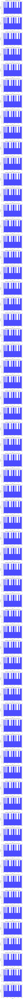

In [511]:
import matplotlib.pyplot as plt

features_matrix = QuantileTransformer(n_quantiles=32).fit_transform(X_degree)

# Assuming 'features_matrix' is your feature matrix
num_columns = features_matrix.shape[1]  # Get the number of columns in the matrix

# Create subplots for each column
fig, axes = plt.subplots(nrows=num_columns, ncols=1, figsize=(6, 4 * num_columns))

# Loop through each column and plot a histogram
for i in range(num_columns):
    ax = axes[i]
    print(min(features_matrix[:, i]), max(features_matrix[:, i]))
    column_data = features_matrix[:, i]  # Get the data of the current column
    ax.hist(column_data, bins=20, color='blue', alpha=0.7)  # Plot histogram
    ax.set_title(f"Histogram of Column {i + 1} mean={np.mean(column_data):.2f} std={np.std(column_data):.2f}")
    ax.set_xlabel("Value")
    ax.set_ylabel("Frequency")

plt.tight_layout()
plt.show()


#### plot models coefficient


In [95]:
import seaborn as sns
import matplotlib.pyplot as plt

# Initialize lists to store mean and std of correlation coefficients for each feature
mean_coeffs = []
std_coeffs = []

# List to store labels (feature names)
ordered_labels = []

# Iterate through each feature and metric
for feature, column_dict in result_dict.items():
    for Y_column, data_dict in column_dict.items():
        # Access the correlation coefficients
        corr_coeffs = data_dict['corr_coeffs']
        
        # Calculate the mean and standard deviation of correlation coefficients across folds
        mean_coeffs = np.mean(corr_coeffs, axis=0)
        std_coeffs = np.std(corr_coeffs, axis=0)
               
        # Sort mean coefficients and corresponding labels in descending order
        sorted_indices = np.argsort(mean_coeffs)  # Sort in descending order
        ordered_coeffs = mean_coeffs.transpose()[sorted_indices].flatten()  # Transpose and sort
        std_coeffs = std_coeffs.transpose()[sorted_indices]
        ordered_labels = np.array(labels)[sorted_indices]
        
        # Create a distribution plot for each coefficient
        plt.figure(figsize=(10, 6))
        sns.histplot(ordered_coeffs, kde=False)
        plt.xlabel('Nodes')
        plt.ylabel('Coefficient Values')
        plt.title(f'Distribution Plot for Coefficients in {Y_column}')
        
        # Set ordered_labels as x-axis tick labels
        plt.xticks(range(len(ordered_coeffs)), ordered_labels, rotation=90)
        
        plt.tight_layout()
        
        # Show the plot for this Y_column
        plt.show()


IndexError: index 9 is out of bounds for axis 0 with size 1

Connectivity matrix
--- SHSS_score ---
Permutation test for r2 values: p=0.8628


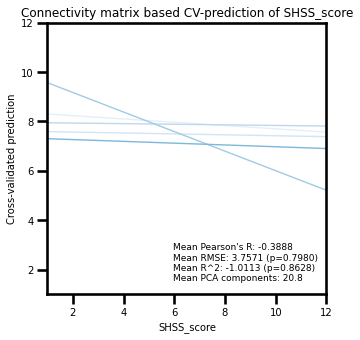

--- raw_change_ANA ---
Permutation test for r2 values: p=0.0864


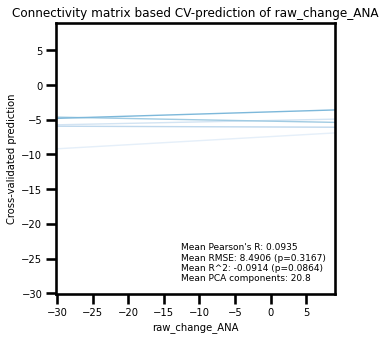

--- raw_change_HYPER ---
Permutation test for r2 values: p=0.1522


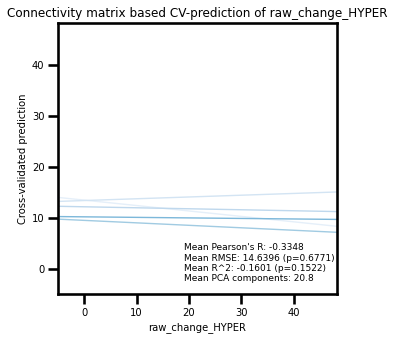

--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.2567


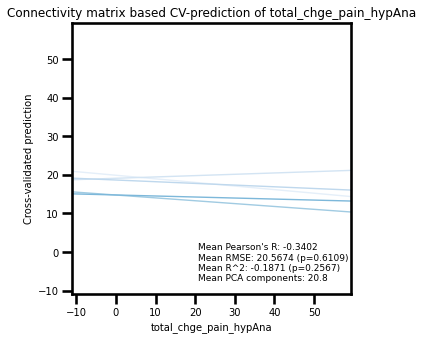

--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.9420


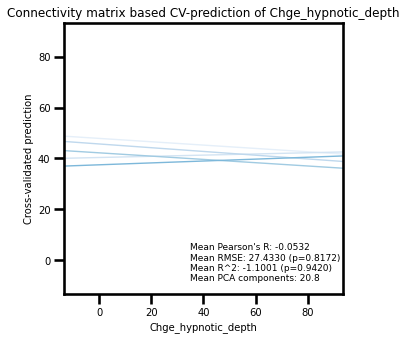

--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.1298


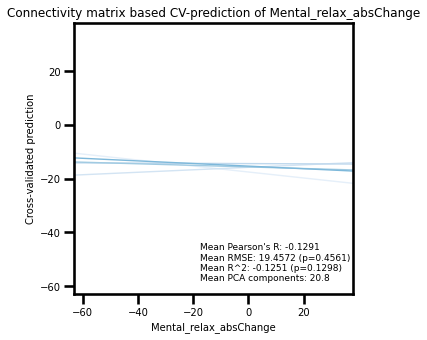

--- Abs_diff_automaticity ---
Permutation test for r2 values: p=0.4569


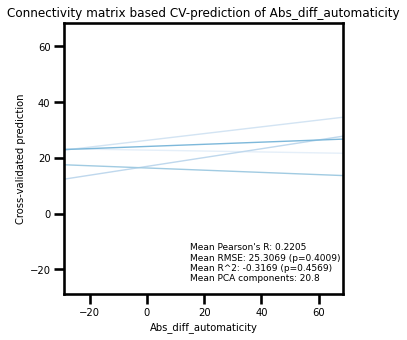

Degree
--- SHSS_score ---
Permutation test for r2 values: p=0.6617


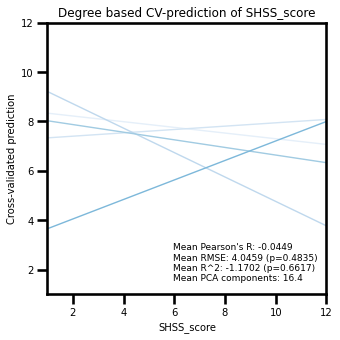

--- raw_change_ANA ---
Permutation test for r2 values: p=0.4421


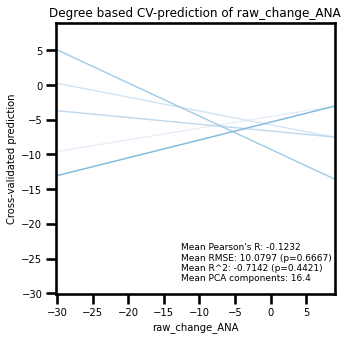

--- raw_change_HYPER ---
Permutation test for r2 values: p=0.0016


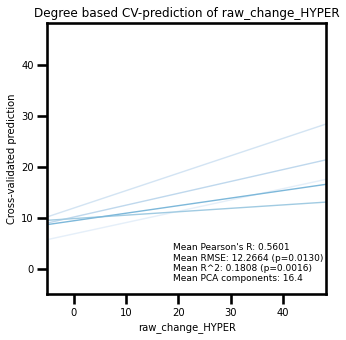

--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.0116


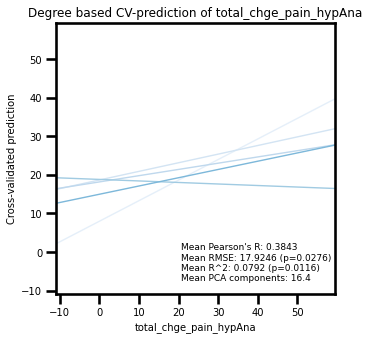

--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.7674


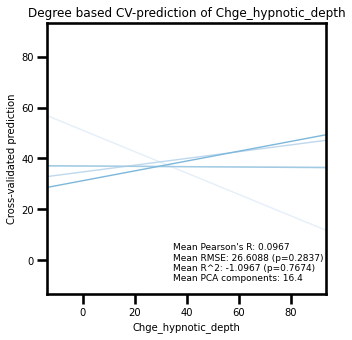

--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.2366


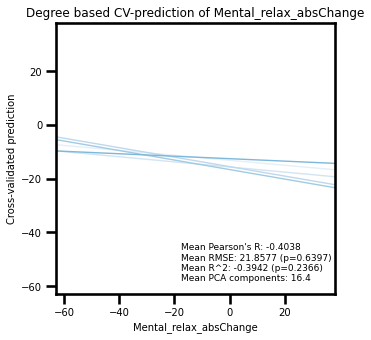

--- Abs_diff_automaticity ---
Permutation test for r2 values: p=0.3945


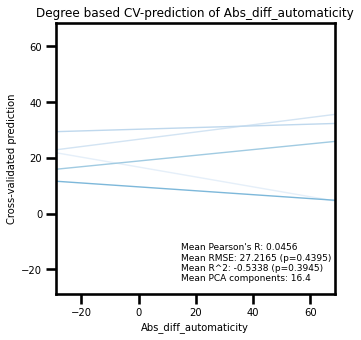

Closeness centrality
--- SHSS_score ---
Permutation test for r2 values: p=0.4669


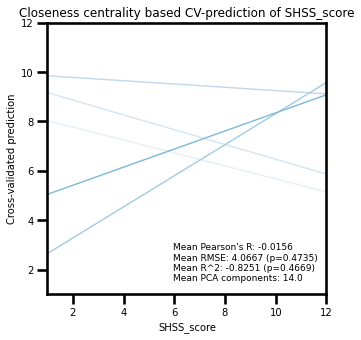

--- raw_change_ANA ---
Permutation test for r2 values: p=0.2529


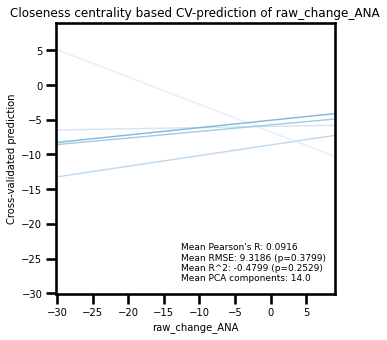

--- raw_change_HYPER ---
Permutation test for r2 values: p=0.1060


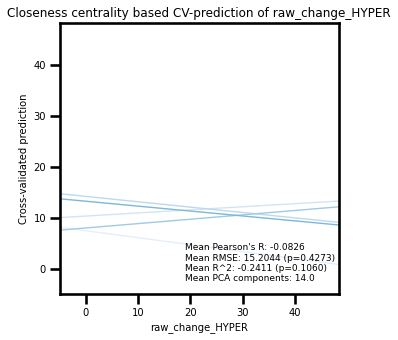

--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.1492


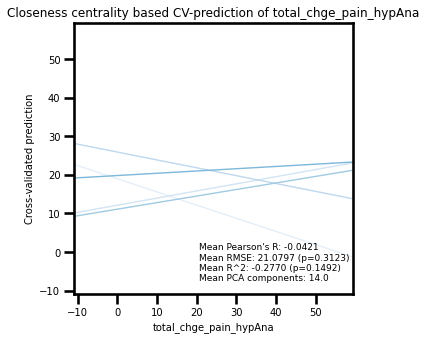

--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.8982


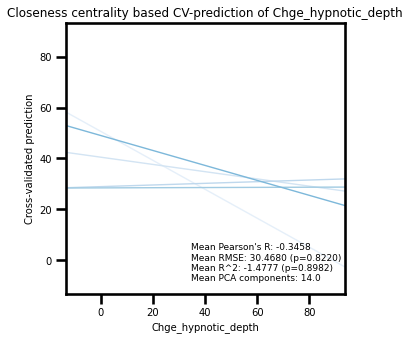

--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.6413


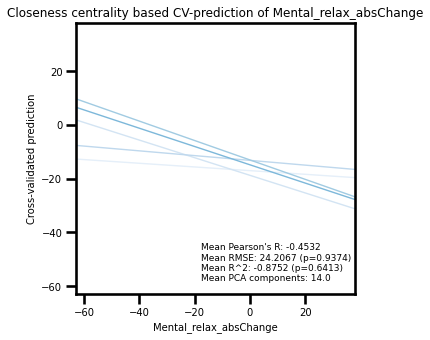

--- Abs_diff_automaticity ---
Permutation test for r2 values: p=0.3271


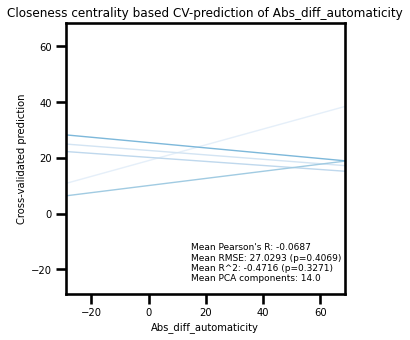

Betweenness centrality
--- SHSS_score ---
Permutation test for r2 values: p=0.8478


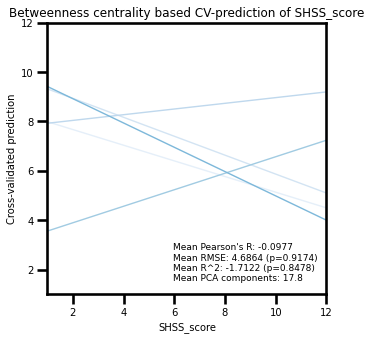

--- raw_change_ANA ---
Permutation test for r2 values: p=0.3723


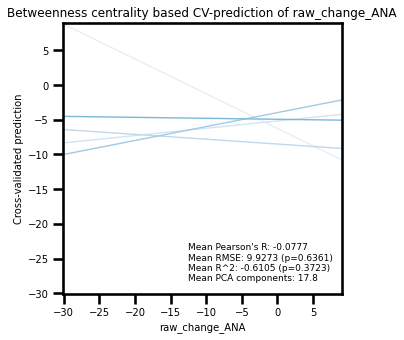

--- raw_change_HYPER ---
Permutation test for r2 values: p=0.5079


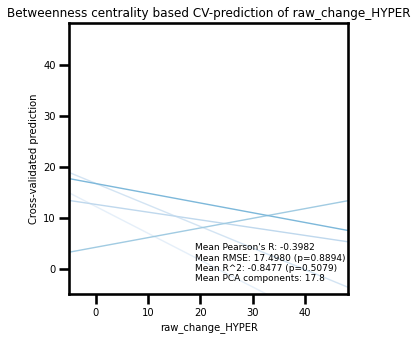

--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.6347


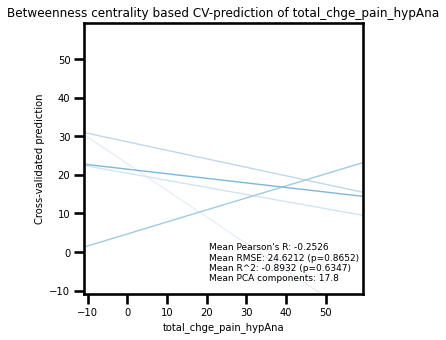

--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.9622


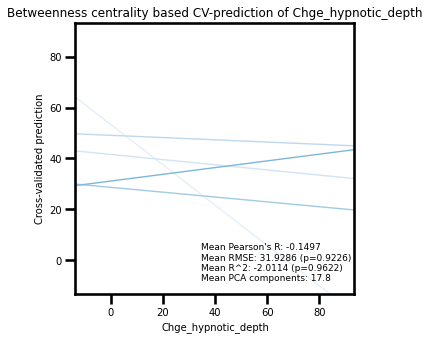

--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.0524


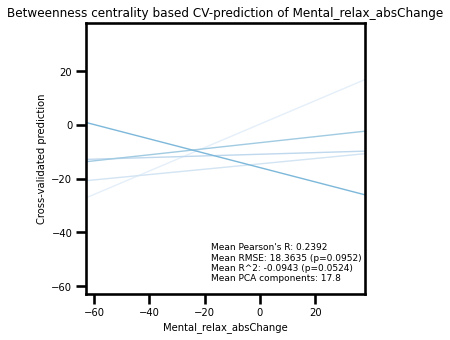

--- Abs_diff_automaticity ---
Permutation test for r2 values: p=0.6345


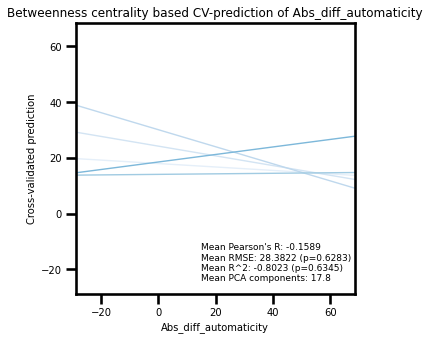

Clustering
--- SHSS_score ---
Permutation test for r2 values: p=0.8846


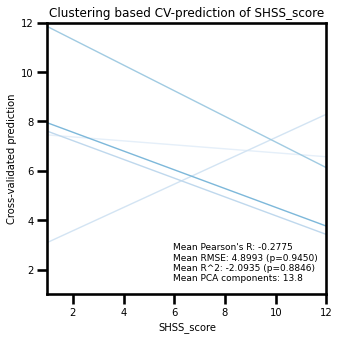

--- raw_change_ANA ---
Permutation test for r2 values: p=0.2543


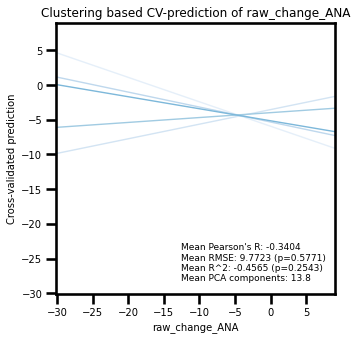

--- raw_change_HYPER ---
Permutation test for r2 values: p=0.1508


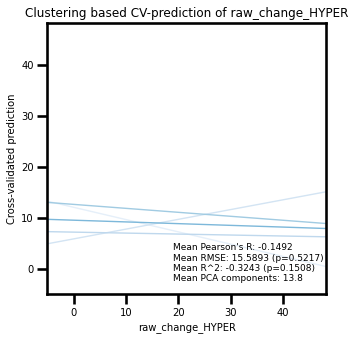

--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.2825


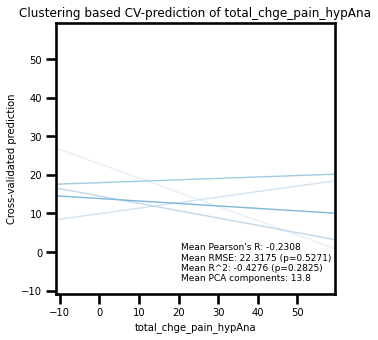

--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.8024


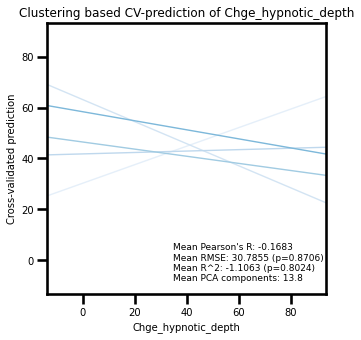

--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.0464


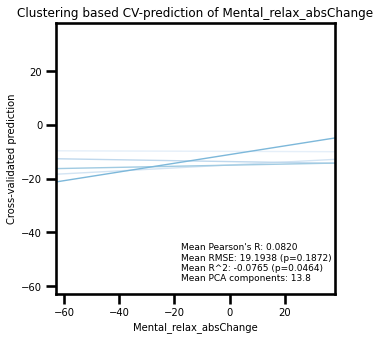

--- Abs_diff_automaticity ---
Permutation test for r2 values: p=0.5743


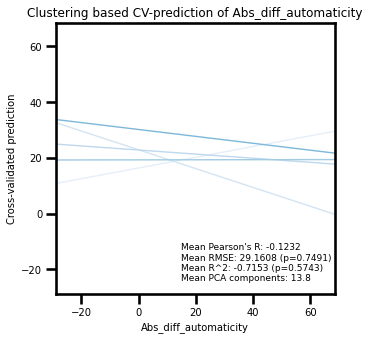

In [674]:
# Ridge model and output for each graph metric and dependent variable
#feature_matrices = [X_degree, X_degreeCentrality, X_closeness, X_betweenness, X_clustering]
#concatenated_matrices = np.vstack(feature_matrices)
#num_participants = X_degree.shape[0]
#group_column = np.tile(np.arange(1, num_participants + 1), len(feature_matrices))

random_seed = 0
for rawfeatures_matrix, g_metric in zip([X_con, X_degree, X_closeness, X_betweenness, X_clustering], ['Connectivity matrix', 'Degree', 'Closeness centrality', 'Betweenness centrality', 'Clustering']):
    print('================ \n{}\n================'.format(g_metric))
    
    prePipeline = Pipeline([('scaler', StandardScaler())])
    features_matrix = prePipeline.fit_transform(rawfeatures_matrix)

    #pipeline = Pipeline([('std', QuantileTransformer(n_quantiles=22)), ('pca', PCA(n_components=0.80)), ('ridge', Ridge())])
    pipeline = Pipeline([('pca', PCA(n_components=0.90)), ('reg', SVR(kernel='linear'))])
    cv = KFold(n_splits=5, random_state=random_seed, shuffle=True)
    #cv = ShuffleSplit(n_splits=10, test_size=0.20, random_state=random_seed)

    for target_column in target_columns:
        print(f"--- {target_column} ---")
        y_preds = []
        y_tests = []
        y = Y[target_column].values
        # Add covariates to the feature matrix (?!!)
        add_cov = False
        #if  target_column != 'SHSS_score':
            #add_cov = True
            #covariate_column = 'SHSS_score'
        '''
        if target_column != 'SHSS_score':
            covariate_column = 'Abs_diff_automaticity'
            add_cov = True
        if add_cov:    
            features_matrix = np.hstack((features_matrix, Y[covariate_column].values.reshape(-1, 1)))
            covariate_corr, p_value = pearsonr(Y[covariate_column], y)
            p_value_corrected = fdrcorrection([p_value])[1][0]  # Apply FDR correction
            print(f"Pearson correlation between {covariate_column} and {target_column}:\n r={covariate_corr:.4f} (FDR corrected p-value: p={p_value_corrected:.4f})")
        '''
        
        pearson_r_scores = []
        r2_scores = []
        mse_scores = []
        rmse_scores = []
        n_components = []
        all_coefficients = []
        
        for train_index, test_index in cv.split(features_matrix):
            # Split the data into train and test sets based on the current fold
            X_train, X_test = features_matrix[train_index], features_matrix[test_index]
            y_train, y_test = y[train_index], y[test_index]
            # Fit pipeline model with best hyperparameters
            pipeline.fit(X_train, y_train)
            y_pred = pipeline.predict(X_test)
            y_preds.append(y_pred)
            y_tests.append(y_test)

            # Calculate evaluation metrics
            pearson_r, _ = pearsonr(y_test, y_pred)
            r2 = r2_score(y_test, y_pred)
            mse = mean_squared_error(y_test, y_pred)
            rmse = np.sqrt(mse)

            # Append metrics to the respective lists
            pearson_r_scores.append(pearson_r)
            r2_scores.append(r2)
            mse_scores.append(mse)
            rmse_scores.append(rmse)
            n_components.append(pipeline.named_steps['pca'].n_components_)
            coefficients = pipeline.named_steps['reg'].coef_
            all_coefficients.append(coefficients)

        #Permutation tests
        r2score, _, r2p_value = compute_permutation(features_matrix, y, pipeline, cv = cv, scoring='r2', random_seed=random_seed)
        rmse_score, _, rmse_p_value = compute_permutation(features_matrix, y, pipeline, cv = cv, scoring='neg_root_mean_squared_error', random_seed=random_seed)
        #r2p_value,rmse_p_value = 0.00001, 0.00001
        
        print(f"Permutation test for r2 values: p={r2p_value:.4f}")
        # Calculate mean metrics across all folds
        mean_pearson_r = np.mean(pearson_r_scores)
        mean_r2 = np.mean(r2_scores)
        mean_mse = np.mean(mse_scores)
        mean_rmse = np.mean(rmse_scores)
        mean_n_components = np.mean(n_components)
        # Calculate standard deviation metrics across all folds
        # avg_z_score = np.mean(np.array(all_coefficients), axis=0) / np.std(all_coefficients, axis=0)
        # print(f"Average z-score = {avg_z_score} std = {np.std(all_coefficients, axis=0)}")
        # Plot
        plot_title = f"{g_metric} based CV-prediction of {target_column}"
        reg_plot_performance(y_tests, y_preds, target_column, mean_pearson_r, mean_rmse, mean_r2, r2p_value,rmse_p_value, mean_n_components, title=plot_title)


Connectivity matrix
--- SHSS_score ---
Permutation test for r2 values: p=0.3653


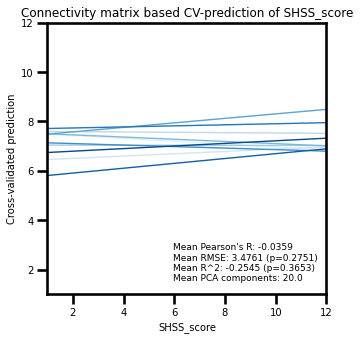

--- raw_change_ANA ---
Permutation test for r2 values: p=0.1594


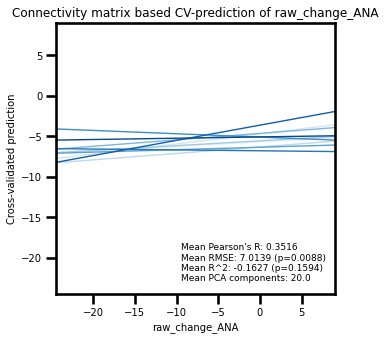

--- raw_change_HYPER ---
Permutation test for r2 values: p=0.2200


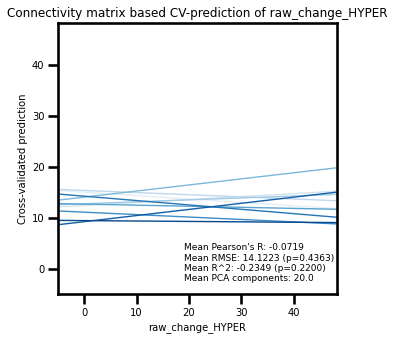

--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.1118


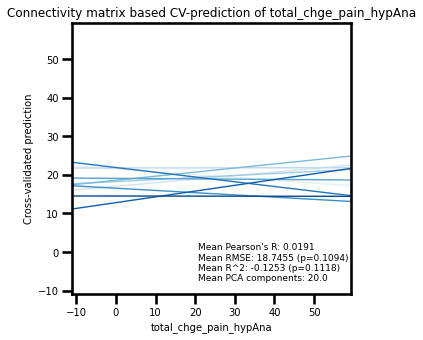

--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.8198


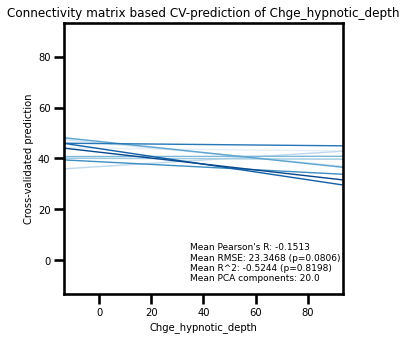

--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.3485


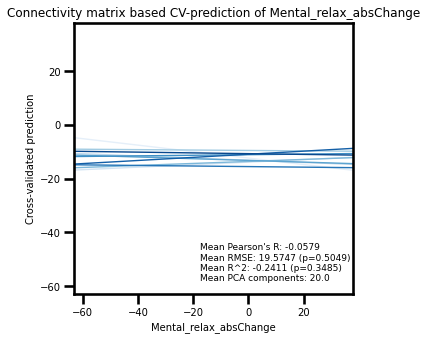

--- Abs_diff_automaticity ---
Permutation test for r2 values: p=0.0612


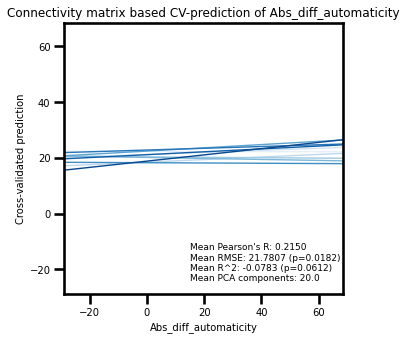

Degree
--- SHSS_score ---
Permutation test for r2 values: p=0.5539


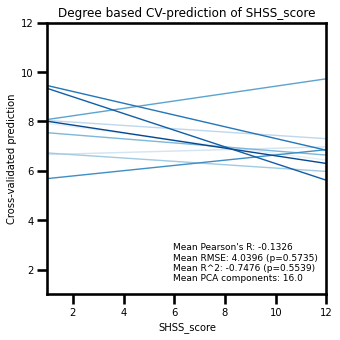

--- raw_change_ANA ---
Permutation test for r2 values: p=0.6915


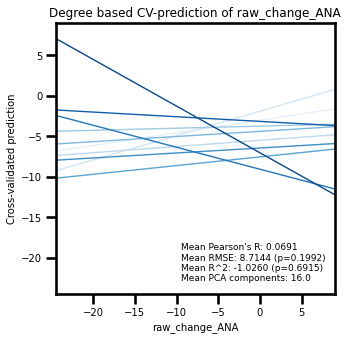

--- raw_change_HYPER ---
Permutation test for r2 values: p=0.0006


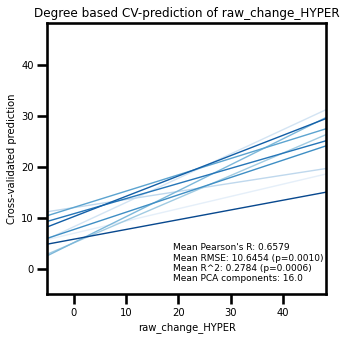

--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.0050


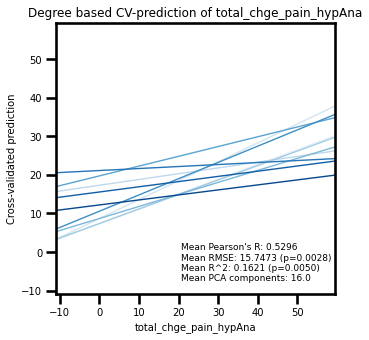

--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.4225


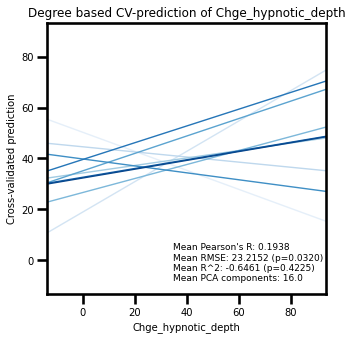

--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.4653


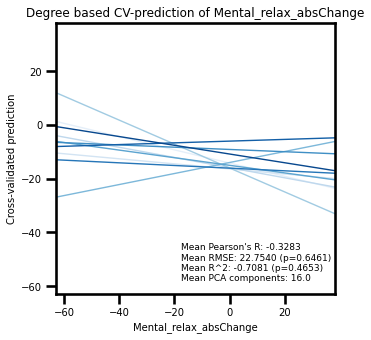

--- Abs_diff_automaticity ---
Permutation test for r2 values: p=0.5979


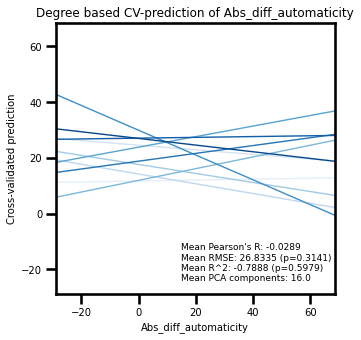

Closeness centrality
--- SHSS_score ---
Permutation test for r2 values: p=0.6847


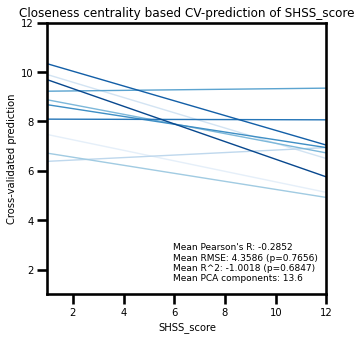

--- raw_change_ANA ---
Permutation test for r2 values: p=0.8774


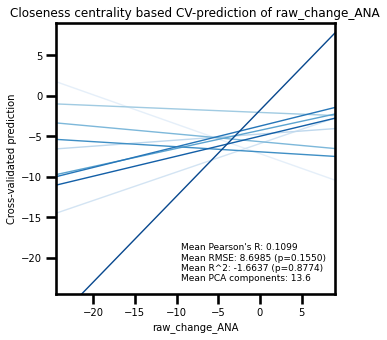

--- raw_change_HYPER ---
Permutation test for r2 values: p=0.4095


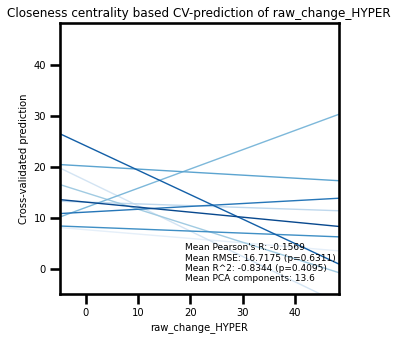

--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.2633


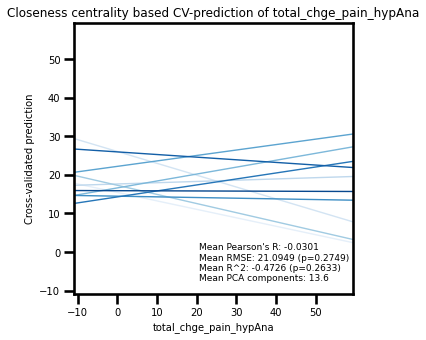

--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.8766


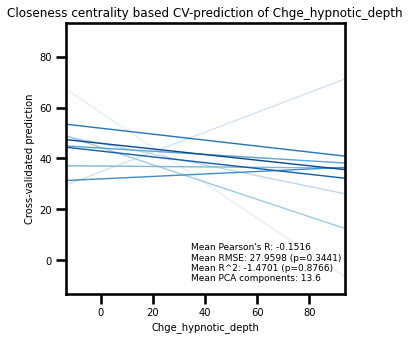

--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.8246


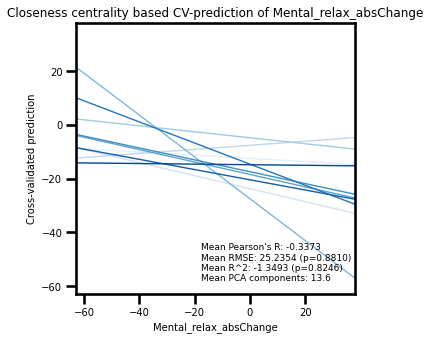

--- Abs_diff_automaticity ---
Permutation test for r2 values: p=0.2721


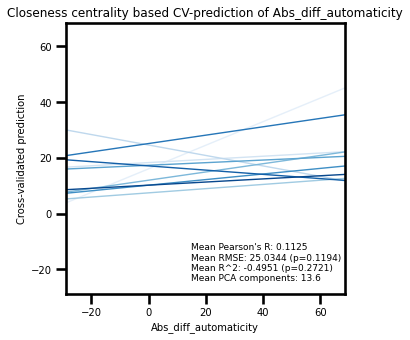

Betweenness centrality
--- SHSS_score ---
Permutation test for r2 values: p=0.7784


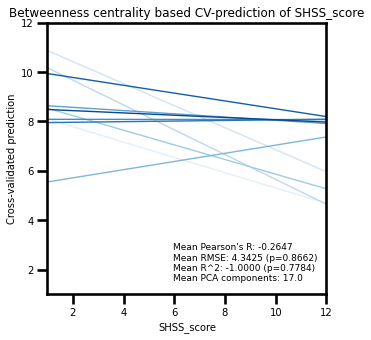

--- raw_change_ANA ---
Permutation test for r2 values: p=0.8420


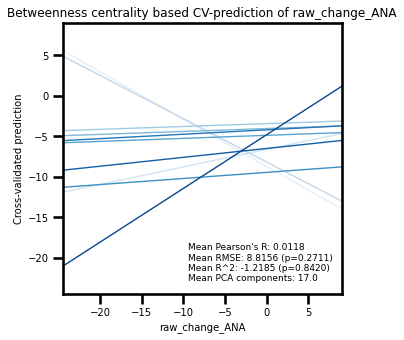

--- raw_change_HYPER ---
Permutation test for r2 values: p=0.6041


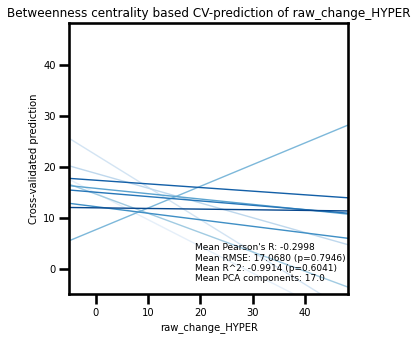

--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.6667


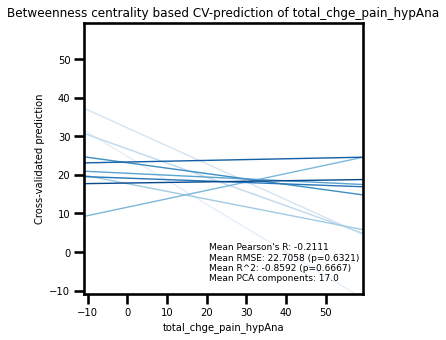

--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.9750


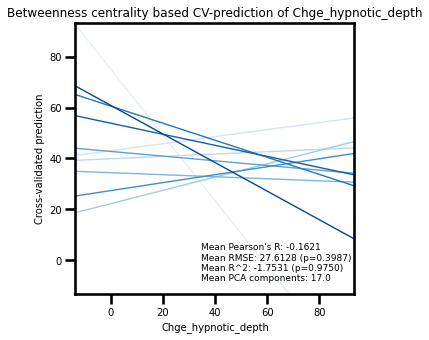

--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.4043


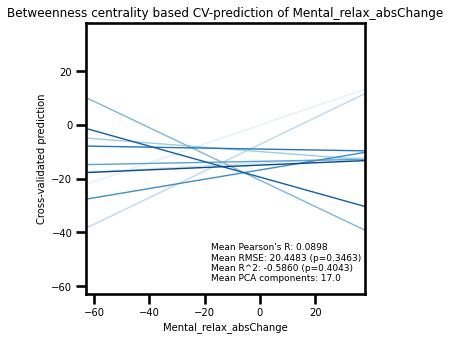

--- Abs_diff_automaticity ---
Permutation test for r2 values: p=0.6793


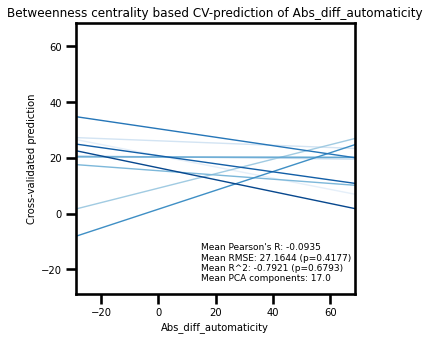

Clustering
--- SHSS_score ---
Permutation test for r2 values: p=0.6609


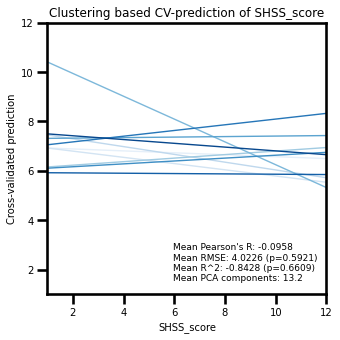

--- raw_change_ANA ---
Permutation test for r2 values: p=0.9012


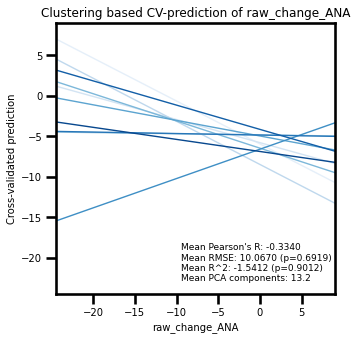

--- raw_change_HYPER ---
Permutation test for r2 values: p=0.3197


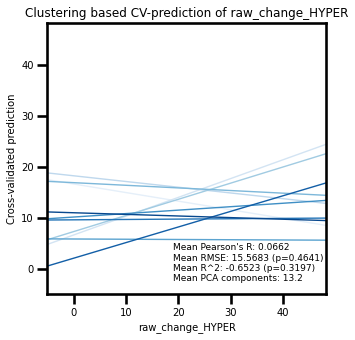

--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.5347


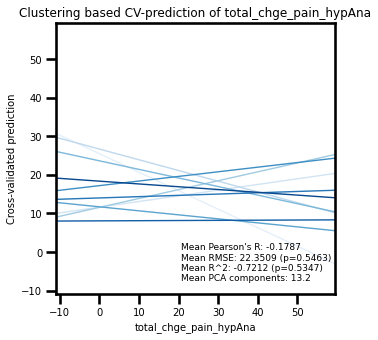

--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.1004


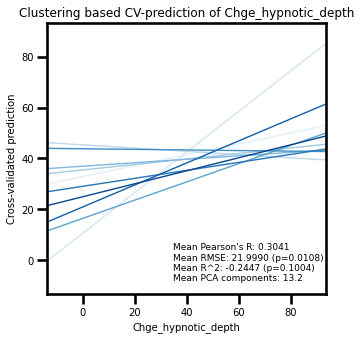

--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.1272


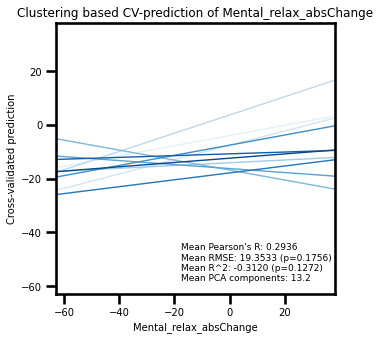

--- Abs_diff_automaticity ---
Permutation test for r2 values: p=0.3629


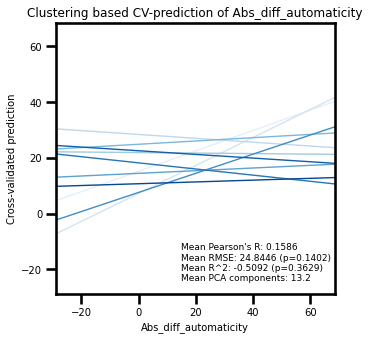

In [675]:
# Ridge model and output for each graph metric and dependent variable
#feature_matrices = [X_degree, X_degreeCentrality, X_closeness, X_betweenness, X_clustering]
#concatenated_matrices = np.vstack(feature_matrices)
#num_participants = X_degree.shape[0]
#group_column = np.tile(np.arange(1, num_participants + 1), len(feature_matrices))

random_seed = 0
for rawfeatures_matrix, g_metric in zip([X_con, X_degree, X_closeness, X_betweenness, X_clustering], ['Connectivity matrix', 'Degree', 'Closeness centrality', 'Betweenness centrality', 'Clustering']):
    print('================ \n{}\n================'.format(g_metric))
    
    prePipeline = Pipeline([('scaler', StandardScaler())])
    features_matrix = prePipeline.fit_transform(rawfeatures_matrix)

    #pipeline = Pipeline([('std', QuantileTransformer(n_quantiles=22)), ('pca', PCA(n_components=0.80)), ('ridge', Ridge())])
    pipeline = Pipeline([('pca', PCA(n_components=0.90)), ('reg', Ridge())])
    #cv = KFold(n_splits=5, random_state=random_seed, shuffle=True)
    cv = ShuffleSplit(n_splits=10, test_size=0.20, random_state=random_seed)

    for target_column in target_columns:
        print(f"--- {target_column} ---")
        y_preds = []
        y_tests = []
        y = Y[target_column].values
        # Add covariates to the feature matrix (?!!)
        add_cov = False
        #if  target_column != 'SHSS_score':
            #add_cov = True
            #covariate_column = 'SHSS_score'
        '''
        if target_column != 'SHSS_score':
            covariate_column = 'Abs_diff_automaticity'
            add_cov = True
        if add_cov:    
            features_matrix = np.hstack((features_matrix, Y[covariate_column].values.reshape(-1, 1)))
            covariate_corr, p_value = pearsonr(Y[covariate_column], y)
            p_value_corrected = fdrcorrection([p_value])[1][0]  # Apply FDR correction
            print(f"Pearson correlation between {covariate_column} and {target_column}:\n r={covariate_corr:.4f} (FDR corrected p-value: p={p_value_corrected:.4f})")
        '''
        
        pearson_r_scores = []
        r2_scores = []
        mse_scores = []
        rmse_scores = []
        n_components = []
        all_coefficients = []
        
        for train_index, test_index in cv.split(features_matrix):
            # Split the data into train and test sets based on the current fold
            X_train, X_test = features_matrix[train_index], features_matrix[test_index]
            y_train, y_test = y[train_index], y[test_index]
            # Fit pipeline model with best hyperparameters
            pipeline.fit(X_train, y_train)
            y_pred = pipeline.predict(X_test)
            y_preds.append(y_pred)
            y_tests.append(y_test)

            # Calculate evaluation metrics
            pearson_r, _ = pearsonr(y_test, y_pred)
            r2 = r2_score(y_test, y_pred)
            mse = mean_squared_error(y_test, y_pred)
            rmse = np.sqrt(mse)

            # Append metrics to the respective lists
            pearson_r_scores.append(pearson_r)
            r2_scores.append(r2)
            mse_scores.append(mse)
            rmse_scores.append(rmse)
            n_components.append(pipeline.named_steps['pca'].n_components_)
            coefficients = pipeline.named_steps['reg'].coef_
            all_coefficients.append(coefficients)

        #Permutation tests
        r2score, _, r2p_value = compute_permutation(features_matrix, y, pipeline, cv = cv, scoring='r2', random_seed=random_seed)
        rmse_score, _, rmse_p_value = compute_permutation(features_matrix, y, pipeline, cv = cv, scoring='neg_root_mean_squared_error', random_seed=random_seed)
        #r2p_value,rmse_p_value = 0.00001, 0.00001
        
        print(f"Permutation test for r2 values: p={r2p_value:.4f}")
        # Calculate mean metrics across all folds
        mean_pearson_r = np.mean(pearson_r_scores)
        mean_r2 = np.mean(r2_scores)
        mean_mse = np.mean(mse_scores)
        mean_rmse = np.mean(rmse_scores)
        mean_n_components = np.mean(n_components)
        # Calculate standard deviation metrics across all folds
        # avg_z_score = np.mean(np.array(all_coefficients), axis=0) / np.std(all_coefficients, axis=0)
        # print(f"Average z-score = {avg_z_score} std = {np.std(all_coefficients, axis=0)}")
        # Plot
        plot_title = f"{g_metric} based CV-prediction of {target_column}"
        reg_plot_performance(y_tests, y_preds, target_column, mean_pearson_r, mean_rmse, mean_r2, r2p_value,rmse_p_value, mean_n_components, title=plot_title)


In [ ]:
#Regular OLS model
from sklearn import datasets, linear_model
from sklearn.svm import SVR
from sklearn.model_selection import cross_val_score, ShuffleSplit
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.stats.multitest import fdrcorrection   
import statsmodels.api as sm

y_col = ["Abs_chge_pain_hypAna", "Chge_hypnotic_depth", "Mental_relax_absChange", "Abs_diff_automaticity"]


for col in y_col:
    y = Y[target_column].values
    x = PCA(n_components=10).fit_transform(X_con)
    lin_reg = sm.OLS(y, sm.add_constant(x)).fit()
    #lin_reg_log = sm.OLS(y_log, x_constant).fit()
    lin_reg_wls = sm.WLS(y, sm.add_constant(x)).fit()
    
    ols_res = lin_reg.summary()
    print(col, '\n-----------',ols_res)
    corr_ps = fdrcorrection(lin_reg.pvalues)[0]
    for i in range(len(corr_ps)):
        if corr_ps[i] == True:
            print('Feature', i, 'is significant with FDR correction')
    model = SVR()
    ss = ShuffleSplit(n_splits=5, test_size=0.25, random_state=0)
    print(cross_val_score(model, x, y, cv=ss))

        


### Classification

In [1]:
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold, cross_val_predict, StratifiedShuffleSplit
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline


y = Y['SHSS_groups']
class_freq = y.value_counts().to_dict()
class_weight = {k: class_freq[k] for k in sorted(class_freq.keys())}

# Plot histogram of Y variable (SHSS groups)
plt.figure(figsize=(8, 6))
sns.histplot(data=y, kde=False, bins=len(y.unique()), color='blue')
plt.title(f'Histogram of SHSS Groups - {g_metric}')
plt.xlabel('SHSS Groups')
plt.ylabel('Frequency')
plt.show()

# Define classifiers
svc_clf = SVC(kernel='linear', C=1,class_weight = 'balanced',decision_function_shape = 'ovo',probability = True, random_state=42)
log_reg_clf = LogisticRegression(C=1, class_weight = 'balanced')
tree_clf = DecisionTreeClassifier(class_weight = 'balanced')

classifiers = [('svc', svc_clf), ('log_reg', log_reg_clf), ('tree', tree_clf)]

for features_matrix, g_metric in zip([X_con, X_degree, X_closeness, X_clustering], ['connectome','Degree', 'closeness', 'Clustering']):
    # Assuming X is your feature matrix and y is the 'SHSS_groups' column
    X = features_matrix
    voting_clf = VotingClassifier(estimators=classifiers, voting='hard')

    pipeline = Pipeline([('std', StandardScaler()), ('pca', PCA(n_components=0.80)), ('clf', voting_clf)])

    skf = StratifiedKFold(n_splits=5,shuffle= True, random_state=42)
    y_pred = cross_val_predict(pipeline, X, y, cv=skf)
    scores = cross_val_score(pipeline, X, y, cv=skf)
    print('scores :', scores)
    # Calculate evaluation metrics
    accuracy = accuracy_score(y, y_pred)
    precision = precision_score(y, y_pred, average='weighted')
    recall = recall_score(y, y_pred, average='weighted')
    f1 = f1_score(y, y_pred, average='weighted')

    print("---", g_metric, "---")
    print("Accuracy:",f"{accuracy:.4f}" )
    print("Precision:", f"{precision:.4f}")
    print("Recall:", f"{recall:.4f}")
    print("F1-score:", f"{f1:.4f}")

    cm = confusion_matrix(y, y_pred)
    print("Confusion Matrix:")
   # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title(f'Confusion Matrix - {g_metric} prediction of SHSS groups')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

   

NameError: name 'Y' is not defined

### Scale comparison from diff. cov. estimator

In [ ]:
resultspz, atlas, labels = load_all(p, 'difumo64_z_precision', 'difumo64') # z precision
resultspp, atlas, labels = load_all(p, 'difumo64_precision', 'difumo64') # psc precision
resultscovz, atlas, labels = load_all(p, 'difumo64_z_covariance', 'difumo64') # z covariance
resultscorz, atlas, labels = load_all(p, 'difumo64_z_correlation', 'difumo64') # z correlation (+arctanh correction)

In [ ]:
resultspz.keys()
# comparison of precisionz, precisionp, covz, corz
print('pre_mean_connectome', resultspz['pre_mean_connectome'].max(), '{:f}'.format(resultspp['pre_mean_connectome'].max()), resultscovz['pre_mean_connectome'].max(), resultscorz['pre_mean_connectome'].max())
print('post_mean_connectome', resultspz['post_mean_connectome'].max(), '{:f}'.format(resultspp['post_mean_connectome'].max()), resultscovz['post_mean_connectome'].max(), resultscorz['post_mean_connectome'].max())
print('zcontrast_mean_connectome', resultspz['zcontrast_mean_connectome'].max(), '{:f}'.format(resultspp['zcontrast_mean_connectome'].max()), resultscovz['zcontrast_mean_connectome'].max(), resultscorz['zcontrast_mean_connectome'].max())
print('pre_series', resultspz['pre_series'][0].max(), '{:f}'.format(resultspp['pre_series'][0].max()), resultscovz['pre_series'][0].max(), resultscorz['pre_series'][0].max())


# Graph theory (single graph)

In [ ]:
import matplotlib.cm as cm
from scipy import stats
from scipy.stats import ttest_1samp

A = results['zcontrast_mean_connectome']
G = nx.from_numpy_matrix(np.matrix(A), create_using=nx.Graph)
G = nx.relabel_nodes(G, dict(zip(range(len(G.nodes())),labels)))
G.edges.data('weight')
edge_weights = G.edges.data('weight')


In [ ]:
# Get the basic structure and dimensions of the keys
print("Number of nodes:", G.number_of_nodes())
print("Number of edges:", G.number_of_edges())
print("Nodes:", G.nodes())
print("Edges:", G.edges())

### Edge density plot

In [ ]:
# plot heatmap
#plt.figure(figsize = (20, 20))
#_ = sns.heatmap(A, cmap='coolwarm', cbar=True, square=False, mask=None)
matrix = A
matrixdiagNaN = matrix.copy()
np.fill_diagonal(matrixdiagNaN,np.nan)

# Weight distribution plot
bins = np.arange(np.sqrt(len(np.concatenate(matrix))))
bins = (bins - np.min(bins))/np.ptp(bins)
fig, axes = plt.subplots(1,2, figsize=(15,5))

# Distribution of raw weights
rawdist = sns.distplot(matrixdiagNaN.flatten(), bins=bins, kde=False, ax=axes[0], norm_hist=True)
rawdist.set(xlabel='Correlation Values', ylabel = 'Density Frequency')

# Probability density of log10
log10dist = sns.distplot(np.log10(matrixdiagNaN).flatten(), kde=False, ax=axes[1], norm_hist=True)
log10dist.set(xlabel='log(weights)')

## Metrics

In [ ]:
import pygsp
G_fd = pygsp.graphs.Graph(A)
G_fd.compute_laplacian(lap_type="normalized")
G_fd.compute_fourier_basis()  # compute connectome harmonics

### Efficiency

In [ ]:

nx.global_efficiency(G)  # this gives efficiency for node 2 and 3


### Degree/Strength

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
from nilearn import plotting

# Compute the degree of the graph
degree = dict(G.degree(weight='weight'))

# Sort the nodes by degree (highest to lowest)
sorted_degree = sorted(degree.items(), key=lambda x: x[1], reverse=True)

# Get the highest 5% of nodes and their degree values
top_5_percent = int(len(sorted_degree) * 0.05)
highest_nodes = sorted_degree[:top_5_percent]

# Print all nodes and their degree values
print("Nodes sorted by degree (highest to lowest):")
for node_label, deg in sorted_degree:
    print(f"{node_label}: {deg}")

# Print the threshold value
threshold = highest_nodes[-1][1]
print(f"Threshold (highest 5%): {threshold}")

# Degree Histogram
sns.distplot(list(degree.values()), kde=False, norm_hist=False)
plt.xlabel('Degree Values')
plt.ylabel('Counts')

# Plot the highest 5% values on the histogram
plt.axvline(x=threshold, color='red', linestyle='--', label='Threshold (highest 5%)')
plt.legend()
plt.show()

# Plot the graph with degree values as the node markers
coords = plotting.find_probabilistic_atlas_cut_coords(atlas) 

# Plot the marker plot with all nodes
plt.figure(figsize=(8, 6))
plotting.plot_markers([degree[node] for node in G.nodes], coords, title='Node densities (correlation estim.) - All Nodes')
plt.show()

# Replace degree values below threshold with 0
for node_label, deg in degree.items():
    if deg < threshold:
        degree[node_label] = 0

# Plot the marker plot with only nodes above the threshold
plt.figure(figsize=(8, 6))
plotting.plot_markers([degree[node] for node in G.nodes], coords, title='Node densities (correlation estim.) - Nodes above Threshold')
plt.show()


In [ ]:
# degree
#Vertex degree quantifies the total number of vertex connections in an undirected binary network (Fornito et al. 2016)
G.degree(weight='weight')
strength = G.degree(weight='weight')
strengths = {node: val for (node, val) in strength}
nx.set_node_attributes(G, dict(strength), 'strength') # Add as nodal attribute

# Normalized node strength values 1/N-1
normstrenghts = {node: val * 1/(len(G.nodes)-1) for (node, val) in strength}
nx.set_node_attributes(G, normstrenghts, 'strengthnorm') # Add as nodal attribute

# Computing the mean degree of the network
normstrengthlist = np.array([val * 1/(len(G.nodes)-1) for (node, val) in strength])
mean_degree = np.sum(normstrengthlist)/len(G.nodes)
print('mean_degree :', mean_degree)
print(strengths)


### closeness

In [ ]:
# The function accepts a argument 'distance' that, in correlation-based networks, must be seen as the inverse ... 
# of the weight value. Thus, a high correlation value (e.g., 0.8) means a shorter distance (i.e., 0.2).
G_distance_dict = {(e1, e2): 1 / abs(weight) for e1, e2, weight in G.edges(data='weight')}

# Then add them as attributes to the graph edges
nx.set_edge_attributes(G, G_distance_dict, 'distance')

# Computation of Closeness closeness
closeness = nx.closeness_closeness(G, distance='distance')

# Now we add the closeness closeness value as an attribute to the nodes
nx.set_node_attributes(G, closeness, 'closecent')

# Closeness closeness Histogram
sns.distplot(list(closeness.values()), kde=False, norm_hist=False)
plt.xlabel('closeness Values')
plt.ylabel('Counts')

plotting.plot_markers([closeness[key] for key in sorted(closeness.keys())], coords)

print(['{} : {}'.format(node, G.nodes[node]['closecent']) for node in G.nodes if G.nodes[node]['closecent'] > 0.135])

Clossness closeness

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
from nilearn import plotting

# The function accepts a argument 'distance' that, in correlation-based networks, must be seen as the inverse ... 
# of the weight value. Thus, a high correlation value (e.g., 0.8) means a shorter distance (i.e., 0.2).
G_distance_dict = {(e1, e2): 1 / abs(weight) for e1, e2, weight in G.edges(data='weight')}

# Then add them as attributes to the graph edges
nx.set_edge_attributes(G, G_distance_dict, 'distance')

# Computation of Closeness closeness
closeness = nx.closeness_closeness(G, distance='distance')

# Now we add the closeness closeness value as an attribute to the nodes
nx.set_node_attributes(G, closeness, 'closecent')

# Sort the nodes by closeness closeness (highest to lowest)
sorted_closeness = sorted(closeness.items(), key=lambda x: x[1], reverse=True)

# Get the highest 5% of nodes and their closeness values
top_5_percent = int(len(sorted_closeness) * 0.05)
highest_nodes = sorted_closeness[:top_5_percent]

# Print all nodes and their closeness closeness values
print("Nodes sorted by closeness closeness (highest to lowest):")
for node_label, closeness in sorted_closeness:
    print(f"{node_label}: {closeness}")

# Print the threshold value
threshold = highest_nodes[-1][1]
print(f"Threshold (highest 5%): {threshold}")

# Closeness closeness Histogram
sns.distplot(list(closeness.values()), kde=False, norm_hist=False)
plt.xlabel('closeness Values')
plt.ylabel('Counts')

# Plot the highest 5% values on the histogram
plt.axvline(x=threshold, color='red', linestyle='--', label='Threshold (highest 5%)')
plt.legend()
plt.show()

# Plot the graph with closeness closeness values as the node markers
coords = plotting.find_probabilistic_atlas_cut_coords(atlas) 

# Plot the marker plot with all nodes
plt.figure(figsize=(8, 6))
plotting.plot_markers([closeness[node] for node in G.nodes], coords, title='Node densities (correlation estim.) - All Nodes')
plt.show()

# Replace closeness values below threshold with 0
for node_label, closeness in closeness.items():
    if closeness < threshold:
        closeness[node_label] = 0

# Plot the marker plot with only nodes above the threshold
plt.figure(figsize=(8, 6))
plotting.plot_markers([closeness[node] for node in G.nodes], coords, title='Node densities (correlation estim.) - Nodes above Threshold')
plt.show()


### Distance and shortest path

"The shortest path is the path with the least number of edges (or least total weight) between two vertices in a network. In a weighted graph, the shortest path is calculated by the minimum sum of the weights of edges between two vertices (Fornito et al. 2016). 
he weights must be converted to ‘distance’ by computing the inverse of the original weight (1−weight or 1weight); a higher correlation value represents a shorter distance (Fornito et al. 2016)"(Centeno,2022)

In [ ]:
# Distance
dist_dict = {(e1,e2): 1/abs(weight) for e1,e2 ,weight in G.edges.data('weight')}
nx.set_edge_attributes(G, dist_dict,'distance')

# Shortest path
short_path = dict(nx.all_pairs_dijkstra_path_length(G, weight='distance'))

In [ ]:
short_path

### *Clustering coefficient
The clustering coefficient assesses the tendency for any two neighbours of a vertex to be directly connected (or more strongly connected in the weighted case) to each other and can also be termed cliquishness (Hallquist and Hillary 2018)

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
from nilearn import plotting

# Clustering Coefficient Calculation
clustering = nx.clustering(G, weight='weight')
nx.set_node_attributes(G, clustering, 'cc')

# Sort the nodes by clustering coefficient (highest to lowest)
sorted_clustering = sorted(clustering.items(), key=lambda x: x[1], reverse=True)

# Get the highest 5% of nodes and their clustering coefficients
top_5_percent = int(len(sorted_clustering) * 0.05)
highest_nodes = sorted_clustering[:top_5_percent]

# Print all nodes and their clustering coefficients
print("Nodes sorted by clustering coefficient (highest to lowest):")
for node_label, cc in sorted_clustering:
    print(f"{node_label}: {cc}")

# Print the threshold value
threshold = highest_nodes[-1][1]
print(f"Threshold (highest 5%): {threshold}")

# Clustering Coefficient Histogram
plt.figure(figsize=(8, 6))
sns.distplot(list(clustering.values()), kde=False, norm_hist=False)
plt.xlabel('Clustering Coefficient')
plt.ylabel('Counts')
plt.axvline(x=threshold, color='red', linestyle='--', label='Threshold (highest 5%)')
plt.legend()
plt.title('Clustering Coefficient Distribution')
plt.show()

# Plot the graph with clustering coefficients as the node markers
coords = plotting.find_probabilistic_atlas_cut_coords(atlas) 

# Plot the marker plot with all nodes
plt.figure(figsize=(8, 6))
plotting.plot_markers([clustering[node] for node in G.nodes], coords, title='Node Clustering Coefficients - All Nodes')
plt.show()

# Replace clustering coefficients values below threshold with 0
for node_label, cc in clustering.items():
    if cc < threshold:
        clustering[node_label] = 0

# Plot the marker plot with only nodes above the threshold
plt.figure(figsize=(8, 6))
plotting.plot_markers([clustering[node] for node in G.nodes], coords, title='Node Clustering Coefficients - Nodes above Threshold')
plt.show()


### ? *Modularity


In [ ]:
#part = nx.community.best_partition(G, weight='weight') # Louvain algorithm
from networkx import community
#part = community.best_partition(G, weight='weight')

# check number of communities
#set(part.values()).union()
communities_generator = nx.community.girvan_newman(G)
top_level_communities = next(communities_generator)
nx.community.modularity(G, top_level_communities)
top_level_communities


In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch

# Your code to generate the communities
communities_generator = nx.community.girvan_newman(G)
top_level_communities = next(communities_generator)
modularity = nx.community.modularity(G, top_level_communities)

# Create a dendrogram of the community structure
dendrogram = sch.dendrogram(sch.linkage(nx.to_numpy_array(G), method='ward'))

# Set plot labels and title
plt.xlabel('Nodes')
plt.ylabel('Distance')
plt.title('Dendrogram of Community Structure')

# Show the plot
plt.show()

# Create a bar plot to show the modularity of each community
community_modularities = [nx.community.modularity(G, community) for community in top_level_communities]
community_labels = [f'Community {i + 1}' for i in range(len(top_level_communities))]

plt.bar(community_labels, community_modularities)
plt.xlabel('Community')
plt.ylabel('Modularity')
plt.title('Modularity of Top-Level Communities')
plt.xticks(rotation=45)

# Show the plot
plt.show()


### Visualization

## Clustering

In [ ]:
lcc = nx.clustering(G, weight='weight')

In [ ]:
# minimum spanning tree
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
from nilearn import plotting

# Compute the minimum spanning tree
mst = nx.minimum_spanning_tree(G, weight='weight')

# Plot the MST on the brain template
coords = plotting.find_probabilistic_atlas_cut_coords(atlas) 

plt.figure(figsize=(8, 6))
plotting.plot_connectome(adjacency_matrix=nx.to_numpy_array(mst),
                         node_coords=coords,
                         node_color='skyblue',
                         edge_cmap='coolwarm',
                         edge_threshold='98%',
                         title='Minimum Spanning Tree (MST)')
plt.show()
